# Implementation of experimental tree building
The goal is to be able to select how many cuts do we want at the beginning and then continue with the tree construction as usual.

In [1]:
import numpy as np
from sklearn.tree import DecisionTreeClassifier, plot_tree
import matplotlib.pyplot as plt
from itertools import product

from sklearn.metrics import mutual_info_score
from sklearn.tree import DecisionTreeClassifier
import pandas as pd

def find_best_cuts(X, y, max_cuts=2, criterion='entropy', n_bins=10):
    n_features = X.shape[1]
    candidate_splits = []

    for j in range(n_features):
        xj = X[:, j]
        thresholds = np.linspace(np.percentile(xj, 5), np.percentile(xj, 95), n_bins)
        best_gain = -np.inf
        best_t = None
        
        for t in thresholds:
            left = y[xj <= t]
            right = y[xj > t]
            if len(left) == 0 or len(right) == 0:
                continue

            p_left = len(left) / len(y)
            p_right = 1 - p_left

            if criterion == 'entropy':
                def entropy(v): return -np.sum([np.mean(v == c) * np.log2(np.mean(v == c)+1e-10) for c in np.unique(y)])
                gain = entropy(y) - (p_left * entropy(left) + p_right * entropy(right))
            elif criterion == 'gini':
                def gini(v): return 1 - np.sum([np.mean(v == c)**2 for c in np.unique(y)])
                gain = gini(y) - (p_left * gini(left) + p_right * gini(right))
            else:
                raise ValueError("criterion debe ser 'entropy' o 'gini'")
            
            if gain > best_gain:
                best_gain = gain
                best_t = t
        
        if best_t is not None:
            candidate_splits.append((best_gain, j, best_t))
    
    candidate_splits.sort(reverse=True, key=lambda x: x[0])
    selected = candidate_splits[:max_cuts]

    return {j: t for _, j, t in selected}


def create_root_with_joint_cuts(X, y, cut_dict, size='regular', criterion='entropy', random_state=0):
    presets = {
        'shallow':  {'max_depth': 1,  'min_samples_leaf': 20, 'min_samples_split': 40},  # total depth 2
        'regular':  {'max_depth': 3,  'min_samples_leaf': 5,  'min_samples_split': 15},
        'overfit':  {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2},
    }

    params = presets.get(size)
    if params is None:
        raise ValueError("Invalid size parameter. Choose from 'shallow', 'regular', or 'overfit'.")
    
    # Si se usa profundidad máxima, le restamos 1 por el nodo raíz
    if params.get('max_depth') is not None:
        params['max_depth'] = max(1, params['max_depth'] - 1)

    n = len(X)
    m = len(cut_dict)
    conditions = list(product([True, False], repeat=m))  # todas las combinaciones de cortes (2^m)
    feature_indices = list(cut_dict.keys())
    thresholds = list(cut_dict.values())

    trees = []
    region_masks = []

    for cond in conditions:
        mask = np.ones(n, dtype=bool)
        for i in range(m):
            f_idx = feature_indices[i]
            t = thresholds[i]
            if cond[i]:
                mask &= X[:, f_idx] <= t
            else:
                mask &= X[:, f_idx] > t

        X_region = X[mask]
        y_region = y[mask]

        if len(y_region) == 0:
            trees.append(None)
            region_masks.append(mask)
            continue

        clf = DecisionTreeClassifier(criterion=criterion, random_state=random_state, **params)
        clf.fit(X_region, y_region)

        trees.append(clf)
        region_masks.append(mask)
    
    return trees, region_masks, conditions, feature_indices, thresholds

def visualize_trees(trees, conditions, feature_indices, thresholds, feature_names=None):
    num_trees = len(trees)
    cols = min(2, num_trees)
    rows = (num_trees + 1) // 2

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 8, rows * 6))
    if num_trees == 1:
        axes = [axes]

    for i, (tree, cond) in enumerate(zip(trees, conditions)):
        if tree is None:
            continue
        row, col = divmod(i, cols)
        ax = axes[row][col] if rows > 1 else axes[col]
        title = " ∧ ".join([
            f"{'≤' if c else '>'} {feature_names[f]}" if feature_names else f"X{f} {'≤' if c else '>'} {thresholds[j]}"
            for j, (f, c) in enumerate(zip(feature_indices, cond))
        ])
        ax.set_title(title)
        plot_tree(tree, ax=ax, filled=True, feature_names=feature_names, class_names=True)
    
    plt.tight_layout()
    plt.show()

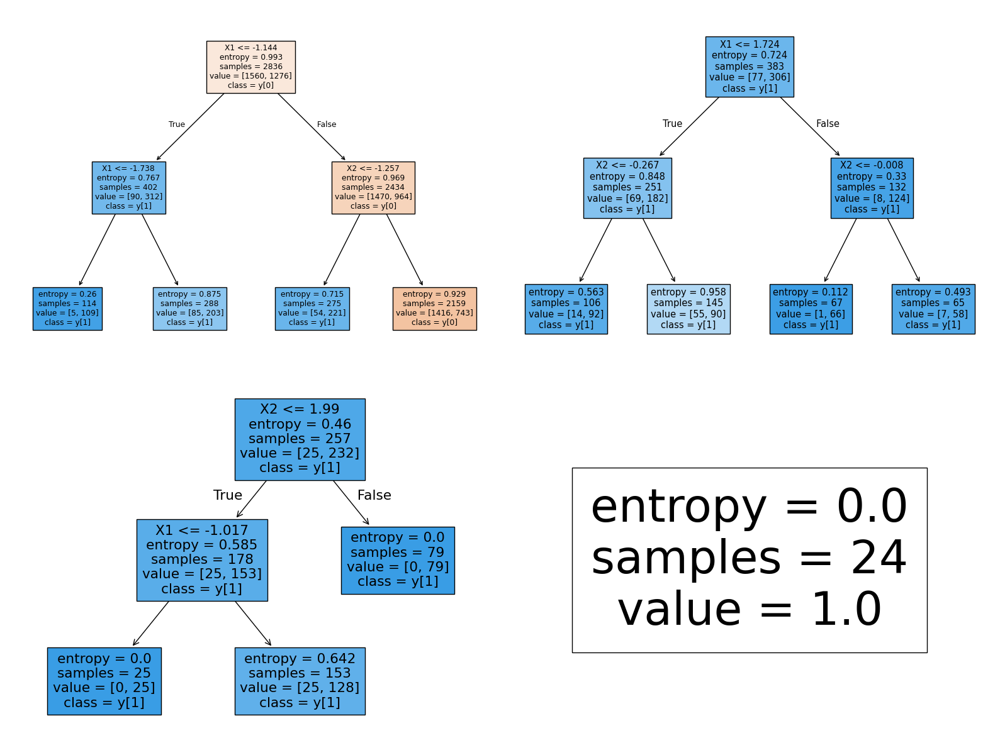

In [2]:
from sklearn.model_selection import train_test_split

# Dataset construction from your parameters
n = 5000
alpha = 1
r0 = 1.5

np.random.seed(0)
X1 = np.random.normal(0, 1, n)
X2 = np.random.normal(0, 1, n)
r2 = X1**2 + X2**2
p = 1 / (1 + np.exp(-alpha * (r2 - r0)))
y = np.random.binomial(1, p)
X = np.column_stack((X1, X2))

# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Definir cortes arbitrarios en X1 y X2 para construir el nodo raíz
# Paso 1: Encontrar mejores cortes
cut_dict = find_best_cuts(X_train, y_train, max_cuts=2, criterion='entropy', n_bins=15)

# Paso 2: Construir árboles por región con profundidad global controlada
trees, masks, conditions, feats, thresholds = create_root_with_joint_cuts(
    X_train, y_train, cut_dict=cut_dict, size='regular', criterion='entropy'
)

# Visualizar árboles
visualize_trees(trees, conditions, feats, thresholds, feature_names=["X1", "X2"])


In [3]:
cut_dict

{1: 1.3755814139688798, 0: 1.1670515302195044}

In [4]:
import matplotlib.patches as patches
import matplotlib.pyplot as plt

def visualize_full_tree_schematic(trees, conditions, feature_indices, thresholds, feature_names=None):
    num_regions = len(trees)
    fig, ax = plt.subplots(figsize=(12, 1.5 + 2 * num_regions))

    # Coordenadas del nodo raíz
    root_x = 0.5
    root_y = 1.0
    ax.text(root_x, root_y, "Nodo raíz conjunto", ha='center', va='center',
            bbox=dict(boxstyle="round,pad=0.3", fc="lightgray", ec="black"))

    y_offset = 0.12
    for i, (tree, cond) in enumerate(zip(trees, conditions)):
        if tree is None:
            continue

        # Construir el texto de la condición
        cond_label = " ∧ ".join([
            f"{feature_names[f]} ≤ {thresholds[j]:.2f}" if c else f"{feature_names[f]} > {thresholds[j]:.2f}"
            for j, (f, c) in enumerate(zip(feature_indices, cond))
        ])

        child_x = (i + 1) / (num_regions + 1)
        child_y = root_y - y_offset

        ax.annotate("",
                    xy=(child_x, child_y + 0.03), xycoords='data',
                    xytext=(root_x, root_y - 0.02), textcoords='data',
                    arrowprops=dict(arrowstyle="->", lw=1.5))

        ax.text(child_x, child_y, cond_label, ha='center', va='center',
                bbox=dict(boxstyle="round,pad=0.3", fc="lightblue", ec="black"))

        ax.text(child_x, child_y - 0.07, f"Árbol #{i}", ha='center', va='top',
                fontsize=10, style='italic')

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1.1)
    ax.axis('off')
    plt.tight_layout()
    plt.show()


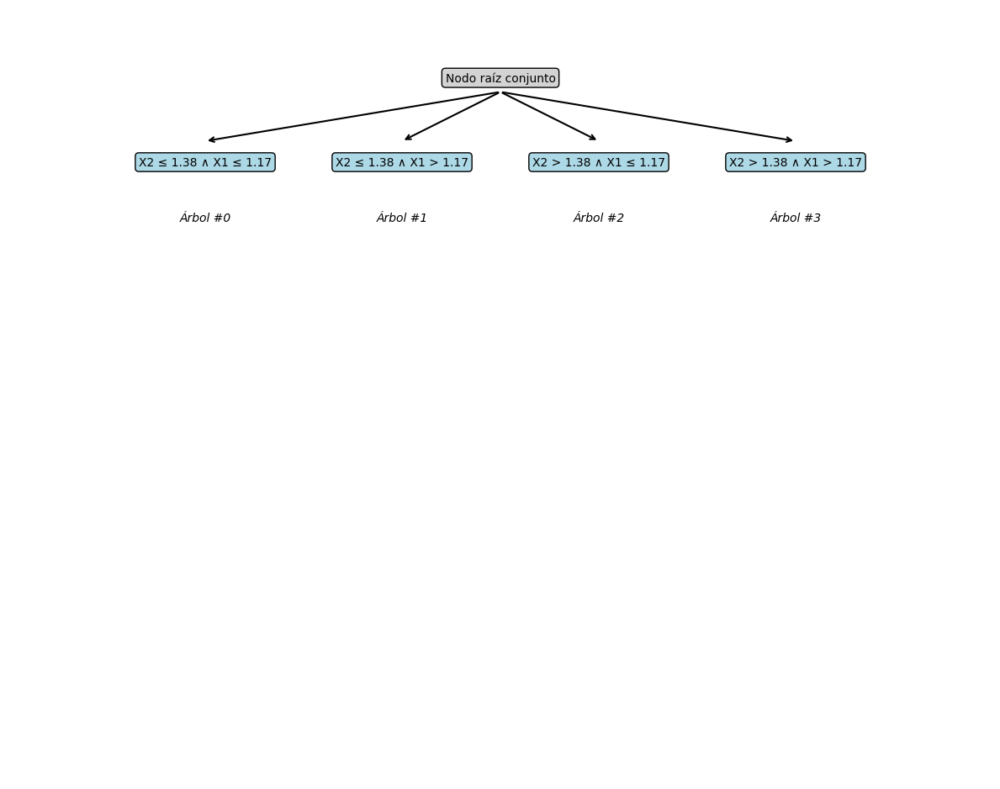

In [5]:
visualize_full_tree_schematic(
    trees,
    conditions,
    feature_indices=feats,
    thresholds=thresholds,
    feature_names=["X1", "X2"]
)


In [6]:
def visualize_root_and_subtrees_grid(trees, conditions, feature_indices, thresholds, feature_names=None):
    num_trees = len(trees)
    cols = min(2, num_trees)
    rows = (num_trees + cols - 1) // cols

    fig = plt.figure(figsize=(10 * cols, 3 + 6 * rows))
    ax_root = plt.subplot2grid((rows + 1, cols), (0, 0), colspan=cols)

    # Dibujar nodo raíz conjunto
    ax_root.axis('off')
    ax_root.text(0.5, 0.8, "Nodo raíz conjunto", ha='center', va='center',
                 bbox=dict(boxstyle="round,pad=0.3", fc="lightgray", ec="black"), fontsize=14)

    # Posiciones horizontales para flechas
    x_positions = np.linspace(0.1, 0.9, num_trees)

    for i, (tree, cond) in enumerate(zip(trees, conditions)):
        if tree is None:
            continue

        cond_label = " ∧ ".join([
            f"{feature_names[f]} ≤ {thresholds[j]:.2f}" if c else f"{feature_names[f]} > {thresholds[j]:.2f}"
            for j, (f, c) in enumerate(zip(feature_indices, cond))
        ])

        # Flechas desde nodo raíz
        ax_root.annotate("",
                         xy=(x_positions[i], 0.55), xycoords='axes fraction',
                         xytext=(0.5, 0.75), textcoords='axes fraction',
                         arrowprops=dict(arrowstyle="->", lw=1.5))
        ax_root.text(x_positions[i], 0.45, cond_label,
                     ha='center', va='top', fontsize=10,
                     bbox=dict(boxstyle="round,pad=0.3", fc="lightblue", ec="black"))

        # Dibujar árbol en subplot correspondiente
        r, c = divmod(i, cols)
        ax_sub = plt.subplot2grid((rows + 1, cols), (r + 1, c))
        ax_sub.set_title(f"Árbol #{i}", fontsize=12)
        plot_tree(tree, ax=ax_sub, filled=True, feature_names=feature_names, class_names=True)

    plt.tight_layout()
    plt.show()


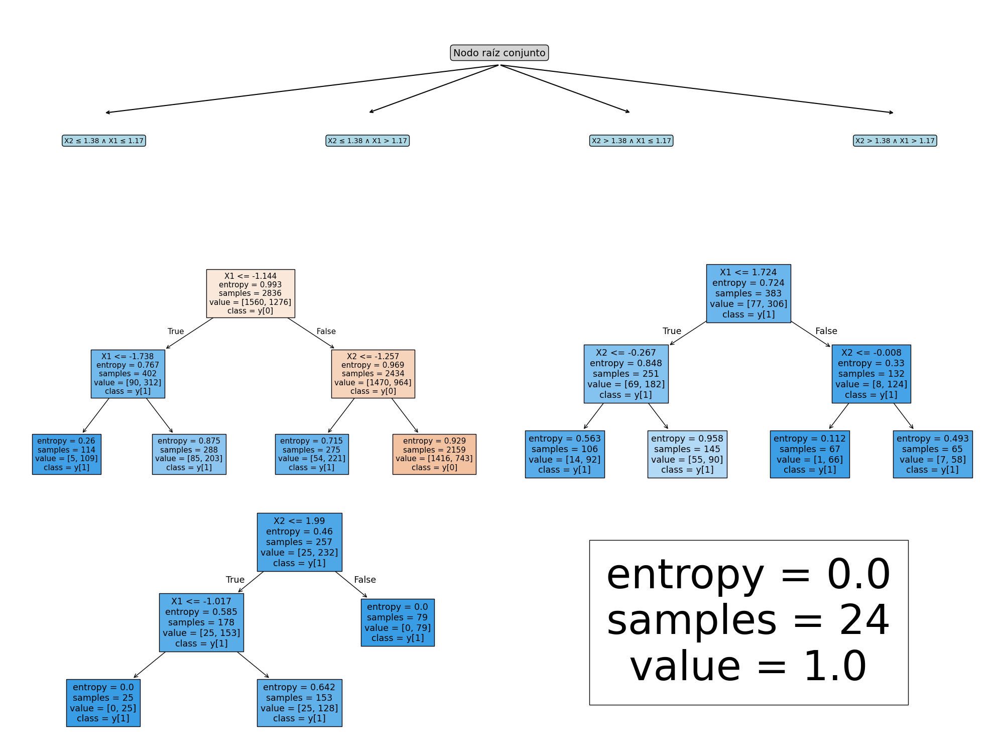

In [7]:
visualize_root_and_subtrees_grid(
    trees,
    conditions,
    feature_indices=feats,
    thresholds=thresholds,
    feature_names=["X1", "X2"]
)


In [8]:
from sklearn.metrics import accuracy_score

def evaluate_forest(trees, region_masks, X, y, cut_dict, feature_names=None):
    """
    Evalúa el conjunto de árboles (uno por región) sobre un conjunto X, y.
    Devuelve el accuracy global y las predicciones.
    """
    m = len(cut_dict)
    feature_indices = list(cut_dict.keys())
    thresholds = list(cut_dict.values())

    predictions = np.zeros(len(X), dtype=int)
    assigned = np.zeros(len(X), dtype=bool)

    conditions = list(product([True, False], repeat=m))

    for i, cond in enumerate(conditions):
        tree = trees[i]
        if tree is None:
            continue

        mask = np.ones(len(X), dtype=bool)
        for j in range(m):
            f_idx = feature_indices[j]
            t = thresholds[j]
            if cond[j]:
                mask &= X[:, f_idx] <= t
            else:
                mask &= X[:, f_idx] > t

        if np.any(mask):
            predictions[mask] = tree.predict(X[mask])
            assigned[mask] = True

    # Solo evaluamos accuracy donde se hizo predicción
    acc = accuracy_score(y[assigned], predictions[assigned])
    return acc, predictions, assigned

# Evaluar en entrenamiento y prueba
train_acc, train_preds, train_assigned = evaluate_forest(trees, masks, X_train, y_train, cut_dict, feature_names=["X1", "X2"])
test_acc, test_preds, test_assigned = evaluate_forest(trees, masks, X_test, y_test, cut_dict, feature_names=["X1", "X2"])

train_acc, test_acc


(0.7174285714285714, 0.7186666666666667)

In [9]:
class CompositeTreeClassifier:
    def __init__(self, trees, cut_dict, feature_names=None):
        self.trees = trees
        self.cut_dict = cut_dict
        self.feature_indices = list(cut_dict.keys())
        self.thresholds = list(cut_dict.values())
        self.feature_names = feature_names
        self.conditions = list(product([True, False], repeat=len(cut_dict)))

    def _region_mask(self, X, cond):
        mask = np.ones(len(X), dtype=bool)
        for j, f_idx in enumerate(self.feature_indices):
            t = self.thresholds[j]
            if cond[j]:
                mask &= X[:, f_idx] <= t
            else:
                mask &= X[:, f_idx] > t
        return mask

    def predict(self, X):
        predictions = np.zeros(len(X), dtype=int)
        assigned = np.zeros(len(X), dtype=bool)

        for i, cond in enumerate(self.conditions):
            tree = self.trees[i]
            if tree is None:
                continue

            mask = self._region_mask(X, cond)
            if np.any(mask):
                predictions[mask] = tree.predict(X[mask])
                assigned[mask] = True

        # Optional: set unassigned predictions to a default class
        predictions[~assigned] = 0
        return predictions

    def predict_proba(self, X):
        # Assume same number of classes across trees
        n_classes = self.trees[0].n_classes_
        probs = np.zeros((len(X), n_classes))
        assigned = np.zeros(len(X), dtype=bool)

        for i, cond in enumerate(self.conditions):
            tree = self.trees[i]
            if tree is None:
                continue

            mask = self._region_mask(X, cond)
            if np.any(mask):
                probs[mask] = tree.predict_proba(X[mask])
                assigned[mask] = True

        return probs

# Crear el clasificador compuesto a partir de los árboles actuales
clf_compuesto = CompositeTreeClassifier(trees, cut_dict, feature_names=["X1", "X2"])


In [10]:
lmt.plot_decision_surface_from_fitted_tree(clf_compuesto, X_train, (0, 1))

NameError: name 'lmt' is not defined

(<Axes: title={'center': 'Predicted probability surface'}, xlabel='Feature 0', ylabel='Feature 1'>,
 <matplotlib.contour.QuadContourSet at 0x23a407d89a0>)

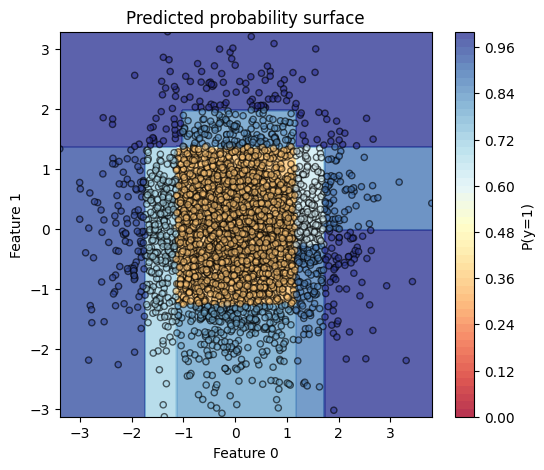

In [ ]:
lmt.plot_probability_surface_tree(clf_compuesto, X_train, (0, 1), prob_class=1)


# Testing

In [11]:
import os, sys, importlib.util

# 1) Where Jupyter is currently running:
cwd = os.getcwd()
print("Notebook cwd:", cwd)

# 2) Compute the folder above (your project root):
project_root = os.path.abspath(os.path.join(cwd, os.pardir))
print("Project root:", project_root)
print("→ Contains:", os.listdir(project_root))

# 3) Inject it onto sys.path (highest priority):
if project_root not in sys.path:
    sys.path.insert(0, project_root)
print("After hack, sys.path[0]:", sys.path[0])

# 4) Confirm Python can now see lmt_pkg:
print("After hack, spec(lmt_pkg):", importlib.util.find_spec("lmt_pkg"))

from lmt_pkg import lmt_final_implementation as lmt
from lmt_pkg import calibration_functions as calibration
from lmt_pkg import logitboost_j_implementation as logitboost
from lmt_pkg import composite_tree

Notebook cwd: c:\Users\allis\Desktop\MITACS\LMT-calibration\Alternative tree
Project root: c:\Users\allis\Desktop\MITACS\LMT-calibration
→ Contains: ['.git', 'Alternative pruning', 'Alternative tree', 'Calibration testing', 'Construction and tests', 'Documentation', 'lmt_pkg', 'Papers', 'README.md']
After hack, sys.path[0]: c:\Users\allis\Desktop\MITACS\LMT-calibration
After hack, spec(lmt_pkg): ModuleSpec(name='lmt_pkg', loader=<_frozen_importlib_external.SourceFileLoader object at 0x0000024099023160>, origin='c:\\Users\\allis\\Desktop\\MITACS\\LMT-calibration\\lmt_pkg\\__init__.py', submodule_search_locations=['c:\\Users\\allis\\Desktop\\MITACS\\LMT-calibration\\lmt_pkg'])


## Circles dataset

In [12]:
import numpy as np
import pandas as pd
from scipy.special import expit   # the sigmoid function
from sklearn.linear_model import LogisticRegression
from sklearn.calibration import calibration_curve
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, roc_auc_score, log_loss
from sklearn.calibration import CalibrationDisplay
from matplotlib.gridspec import GridSpec

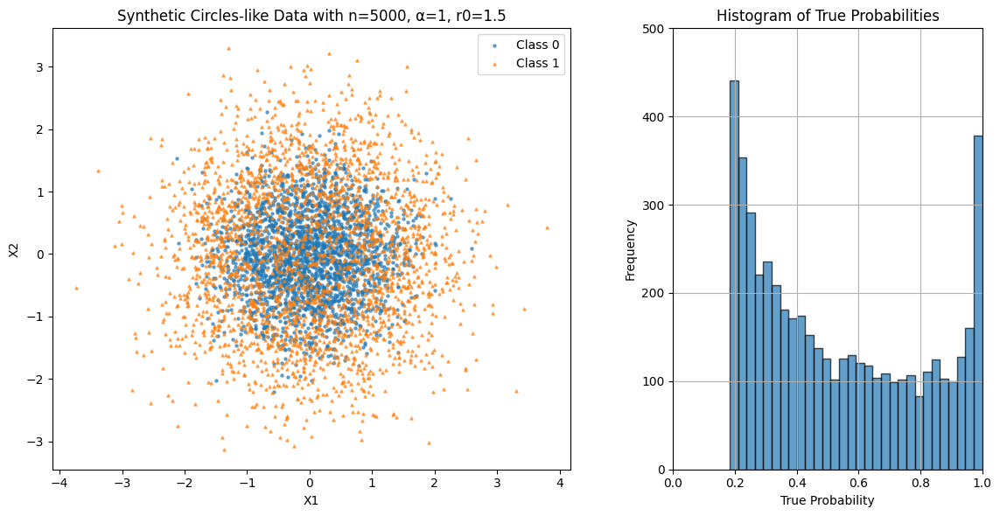

Proportion of positive samples: 0.53


In [13]:
# 1) PARAMETERS
n = 5000
alpha = 1 # controls sharpness of the circle boundary
r0 = 1.5   # target radius

# 2) SIMULATE FEATURES from a normal distribution
np.random.seed(0)  # for reproducibility
X1 = np.random.normal(0, 1, n)
X2 = np.random.normal(0, 1, n)
r2 = X1**2 + X2**2

# 3) DEFINE TRUE PROBABILITIES USING A SIGMOID ON r^2 - r0
p = 1 / (1 + np.exp(-alpha * (r2 - r0)))

# 4) SAMPLE OUTCOME y ~ Bernoulli(p)
y = np.random.binomial(1, p)


# Subplots for the scatter plot and the histogram
fig = plt.figure(figsize=(12, 6))
gs = GridSpec(1, 2, width_ratios=[2, 1])

# a) SCATTER PLOT
classes = np.unique(y)
ax1 = fig.add_subplot(gs[0])
ax1.set_title(f'Synthetic Circles-like Data with n={n}, α={alpha}, r0={r0}')
ax1.set_xlabel('X1')
ax1.set_ylabel('X2')
# Plot the points with different markers for each class
for cls, marker in zip(classes, ['o', '^']):
    ax1.scatter(
        X1[y==cls], 
        X2[y==cls], 
        alpha=0.6, 
        marker=marker, 
        label=f'Class {int(cls)}',
        s=5
    )
ax1.legend()

# b) HISTOGRAM OF PROBABILITIES
ax2 = fig.add_subplot(gs[1])
ax2.set_title('Histogram of True Probabilities')
ax2.set_xlabel('True Probability')
ax2.set_ylabel('Frequency')
ax2.hist(p, bins=30, alpha=0.7, edgecolor='black')
ax2.grid()
# Show the plots in equal proportions without blank spaces
ax2.set_xlim(0, 1)
ax2.set_ylim(0, 500)
ax2.set_aspect('auto', adjustable='box')
ax1.set_aspect('equal', adjustable='box')
plt.tight_layout()
plt.show()

# Proportion of positive samples
positive_proportion = np.mean(y)
print(f"Proportion of positive samples: {positive_proportion:.2f}")

# Full dataset
X = np.column_stack((X1, X2))   # now X has shape (n,2)
# extend X with that third column
X_ext = np.column_stack((X, r2))  # shape (n,3)
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_ext, y, test_size=0.3)

### Composite Decision Trees

ORIGINAL DATASET
Best cuts found (same feature): {1: [1.1793862924432845, 1.4152379049410884]}
Best cuts found (different features): {1: [1.1793862924432845], 0: [-1.170885347382412]}

Best 2 cuts (same feature)
Train accuracy: 0.73, Test accuracy: 0.70

Best 2 cuts (different features)
Train accuracy: 0.73, Test accuracy: 0.71


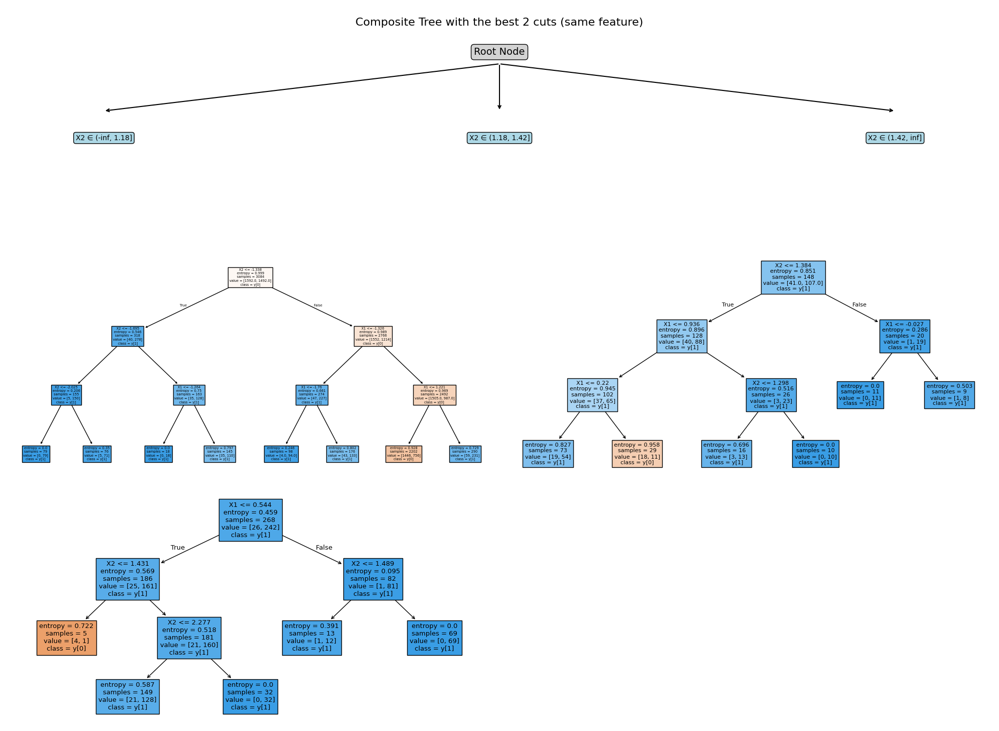

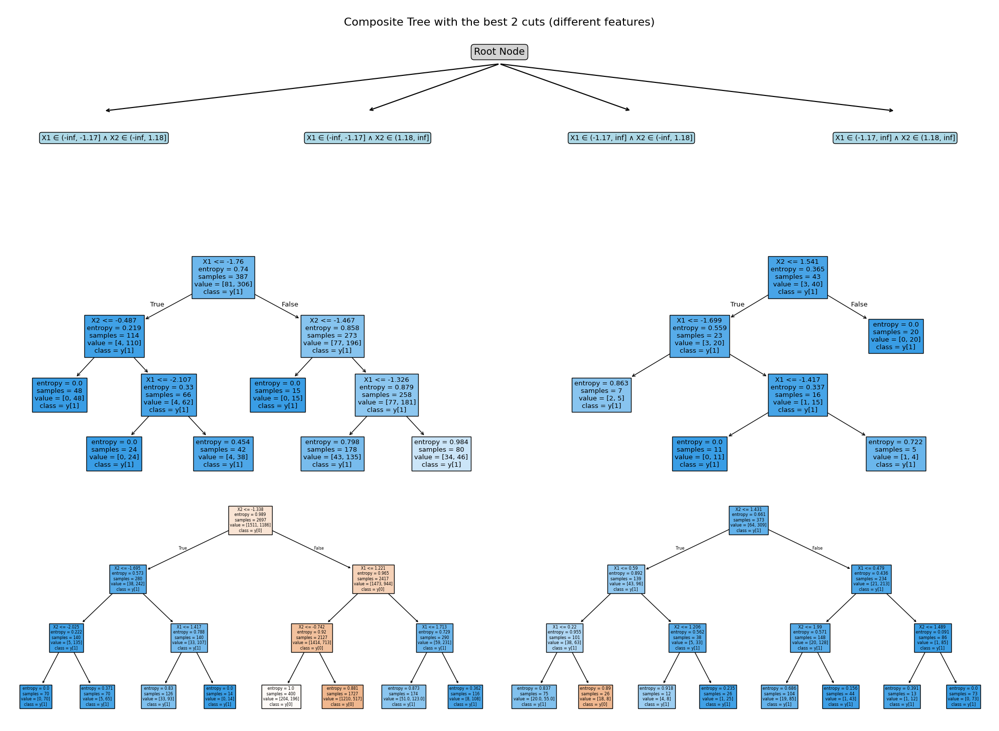

In [14]:
print("ORIGINAL DATASET")
# Find best cuts in general
cut_dict0 = composite_tree.find_best_cuts_multiple_per_feature(
    X_train[:, :2], y_train,
    max_cuts=2,
    top_k_per_feature=2,
    criterion='entropy',
    n_bins=15
)
print("Best cuts found (same feature):", cut_dict0)

# Find best cuts in X1 and X2 to build the root node
cut_dict = composite_tree.find_best_cuts_multiple_per_feature(X_train[:, :2], y_train, max_cuts=2, top_k_per_feature=1, criterion='entropy', n_bins=15)
print("Best cuts found (different features):", cut_dict)

# build trees by region with controlled global depth
trees0, masks0, region_conditions0, feats, thresholds0 = composite_tree.create_root_with_multiple_thresholds(
    X_train[:, :2], y_train, cut_dict=cut_dict0, size='regular'
)
trees, masks, region_conditions, feats, thresholds = composite_tree.create_root_with_multiple_thresholds(
    X_train[:, :2], y_train, cut_dict=cut_dict, size='regular'
)

# get acccuracy on training and test sets
print("\nBest 2 cuts (same feature)")
train_acc0, train_preds0, train_assigned0 = composite_tree.evaluate_forest_with_intervals(trees0, X_train[:, :2], y_train, region_conditions0)
test_acc0, test_preds0, test_assigned0 = composite_tree.evaluate_forest_with_intervals(trees0, X_test[:, :2], y_test, region_conditions0)
print(f"Train accuracy: {train_acc0:.2f}, Test accuracy: {test_acc0:.2f}")

print("\nBest 2 cuts (different features)")
train_acc, train_preds, train_assigned = composite_tree.evaluate_forest_with_intervals(trees, X_train[:, :2], y_train, region_conditions)
test_acc, test_preds, test_assigned = composite_tree.evaluate_forest_with_intervals(trees, X_test[:, :2], y_test, region_conditions)
print(f"Train accuracy: {train_acc:.2f}, Test accuracy: {test_acc:.2f}")

# Plot the first tree with the best 2 cuts (same feature)
composite_tree.visualize_root_and_subtrees_grid_with_intervals(
    trees0,
    region_conditions0,
    feature_names=["X1", "X2"],
    title="Composite Tree with the best 2 cuts (same feature)"
)
# Plot the second tree with the best 2 cuts (different features)
composite_tree.visualize_root_and_subtrees_grid_with_intervals(
    trees,
    region_conditions,
    feature_names=["X1", "X2"],
    title="Composite Tree with the best 2 cuts (different features)"
)


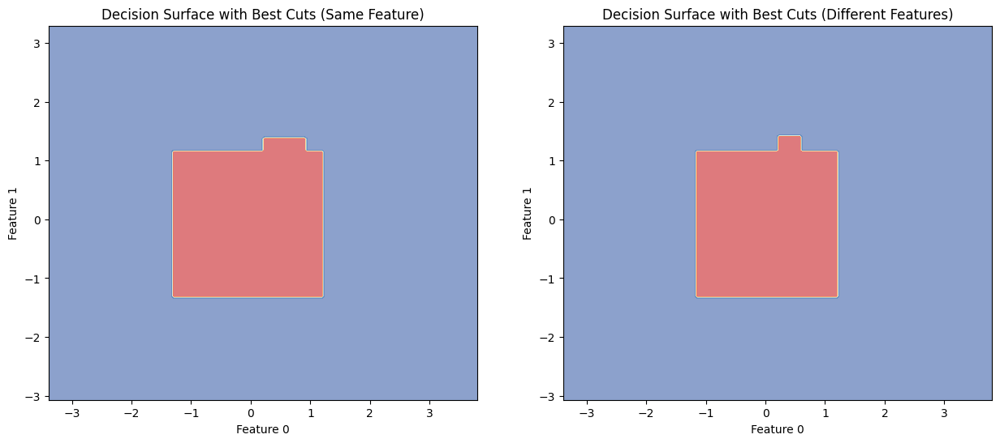

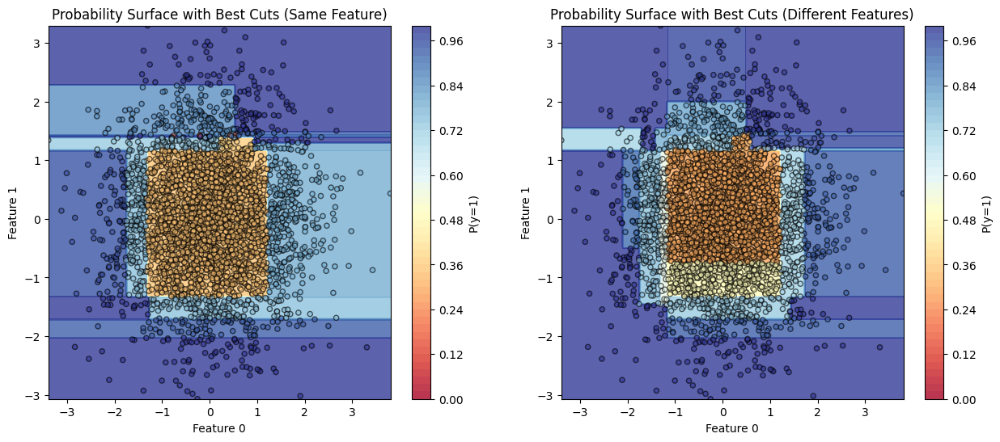

In [15]:
# Subplt for the decision surface and the probability surface
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
# Decision surface
lmt.plot_decision_surface_from_fitted_tree(
    composite_tree.CompositeTreeClassifier(trees0, region_conditions0, feature_names=["X1", "X2"]),
    X_train[:,:2], (0, 1), ax=ax[0], title="Decision Surface with Best Cuts (Same Feature)"
)
lmt.plot_decision_surface_from_fitted_tree(
    composite_tree.CompositeTreeClassifier(trees, region_conditions, feature_names=["X1", "X2"]),
    X_train[:,:2], (0, 1), ax=ax[1], title="Decision Surface with Best Cuts (Different Features)"
)
plt.show()

# Probability surface
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
lmt.plot_probability_surface_tree(
    composite_tree.CompositeTreeClassifier(trees0, region_conditions0, feature_names=["X1", "X2"]),
    X_train[:,:2], (0, 1), prob_class=1, ax=ax[0], title="Probability Surface with Best Cuts (Same Feature)"
)
lmt.plot_probability_surface_tree(
    composite_tree.CompositeTreeClassifier(trees, region_conditions, feature_names=["X1", "X2"]),
    X_train[:,:2], (0, 1), prob_class=1, ax=ax[1], title="Probability Surface with Best Cuts (Different Features)"
)
plt.show()

EXTENDED DATASET
Best cuts found (same feature): {2: [2.1853079784424483, 1.7668655838517153]}
Best cuts found (different features): {2: [2.1853079784424483], 1: [1.1793862924432845]}

Best 2 cuts (same feature)
Train accuracy: 0.74, Test accuracy: 0.74

Best 2 cuts (different features)
Train accuracy: 0.74, Test accuracy: 0.74


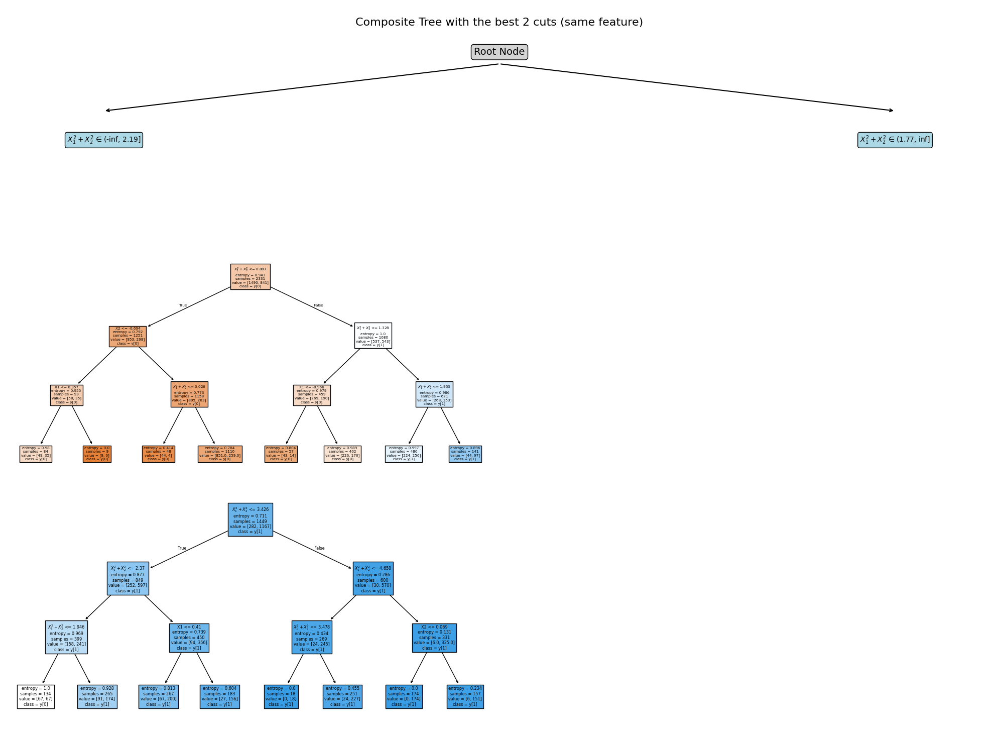

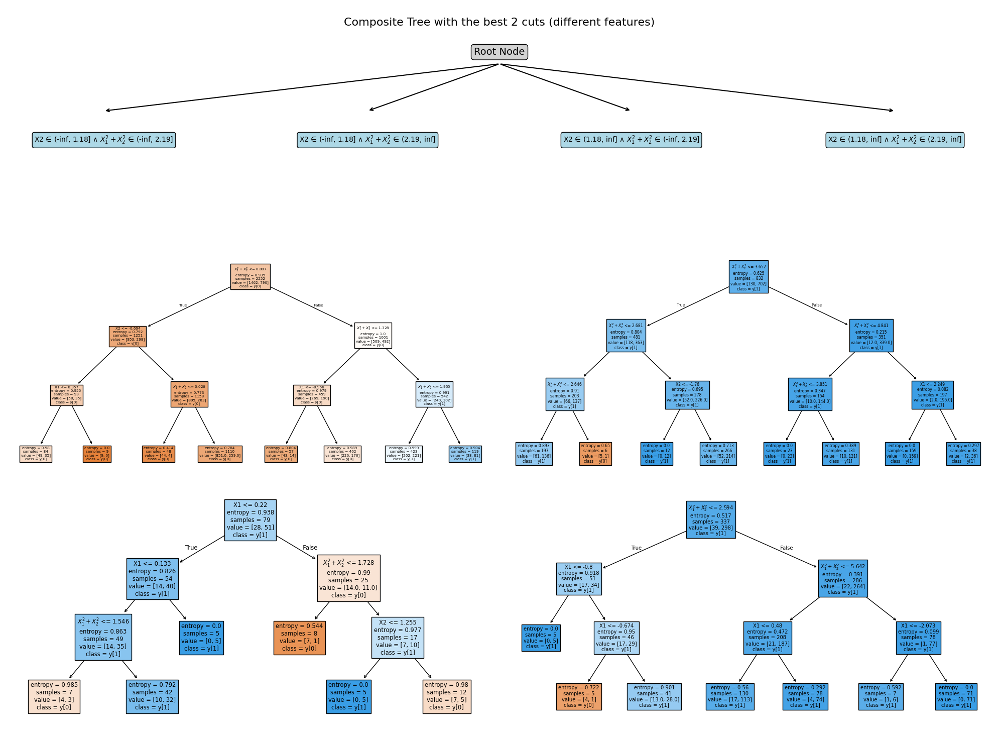

In [16]:
print("EXTENDED DATASET")
# Find best cuts in general
cut_dict0 = composite_tree.find_best_cuts_multiple_per_feature(
    X_train, y_train,
    max_cuts=2,
    top_k_per_feature=2,
    criterion='entropy',
    n_bins=15
)
print("Best cuts found (same feature):", cut_dict0)

# Find best cuts in X1 and X2 to build the root node
cut_dict = composite_tree.find_best_cuts_multiple_per_feature(X_train, y_train, max_cuts=2, top_k_per_feature=1, criterion='entropy', n_bins=15)
print("Best cuts found (different features):", cut_dict)

# build trees by region with controlled global depth
trees0, masks0, region_conditions0, feats, thresholds0 = composite_tree.create_root_with_multiple_thresholds(
    X_train, y_train, cut_dict=cut_dict0, size='regular'
)
trees, masks, region_conditions, feats, thresholds = composite_tree.create_root_with_multiple_thresholds(
    X_train, y_train, cut_dict=cut_dict, size='regular'
)

# get acccuracy on training and test sets
print("\nBest 2 cuts (same feature)")
train_acc0, train_preds0, train_assigned0 = composite_tree.evaluate_forest_with_intervals(trees0, X_train, y_train, region_conditions0)
test_acc0, test_preds0, test_assigned0 = composite_tree.evaluate_forest_with_intervals(trees0, X_test, y_test, region_conditions0)
print(f"Train accuracy: {train_acc0:.2f}, Test accuracy: {test_acc0:.2f}")

print("\nBest 2 cuts (different features)")
train_acc, train_preds, train_assigned = composite_tree.evaluate_forest_with_intervals(trees, X_train, y_train, region_conditions)
test_acc, test_preds, test_assigned = composite_tree.evaluate_forest_with_intervals(trees, X_test, y_test, region_conditions)
print(f"Train accuracy: {train_acc:.2f}, Test accuracy: {test_acc:.2f}")

# Plot the first tree with the best 2 cuts (same feature)
composite_tree.visualize_root_and_subtrees_grid_with_intervals(
    trees0,
    region_conditions0,
    feature_names=["X1", "X2", "$X_1^2 + X_2^2$"],
    title="Composite Tree with the best 2 cuts (same feature)"
)
# Plot the second tree with the best 2 cuts (different features)
composite_tree.visualize_root_and_subtrees_grid_with_intervals(
    trees,
    region_conditions,
    feature_names=["X1", "X2", "$X_1^2 + X_2^2$"],
    title="Composite Tree with the best 2 cuts (different features)"
)


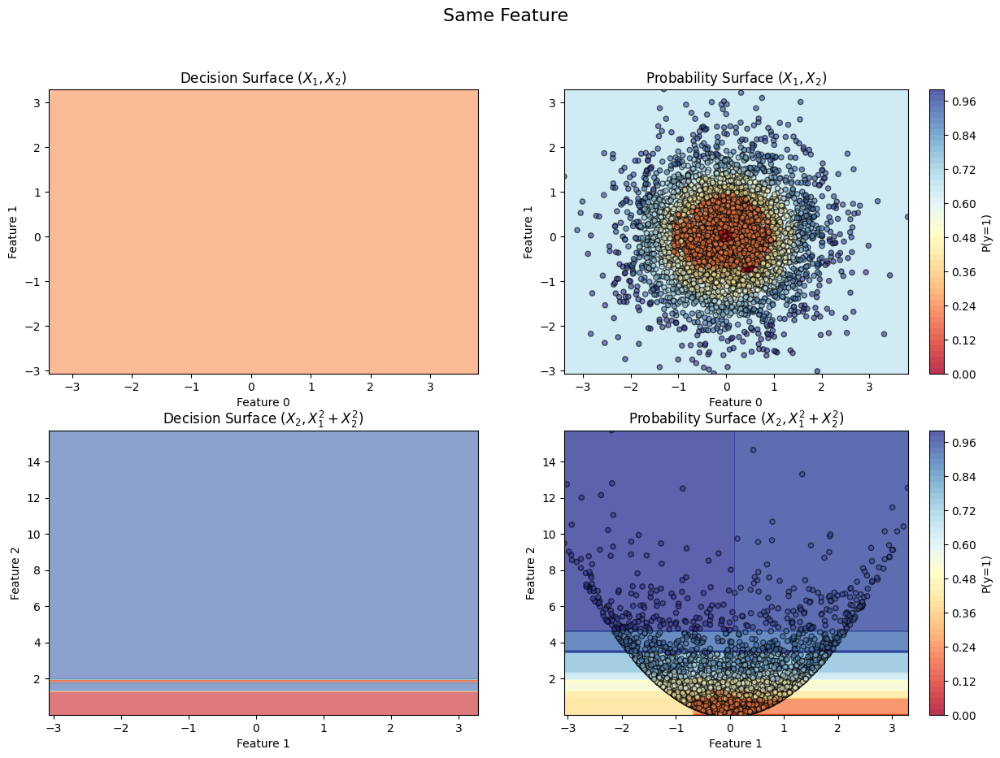

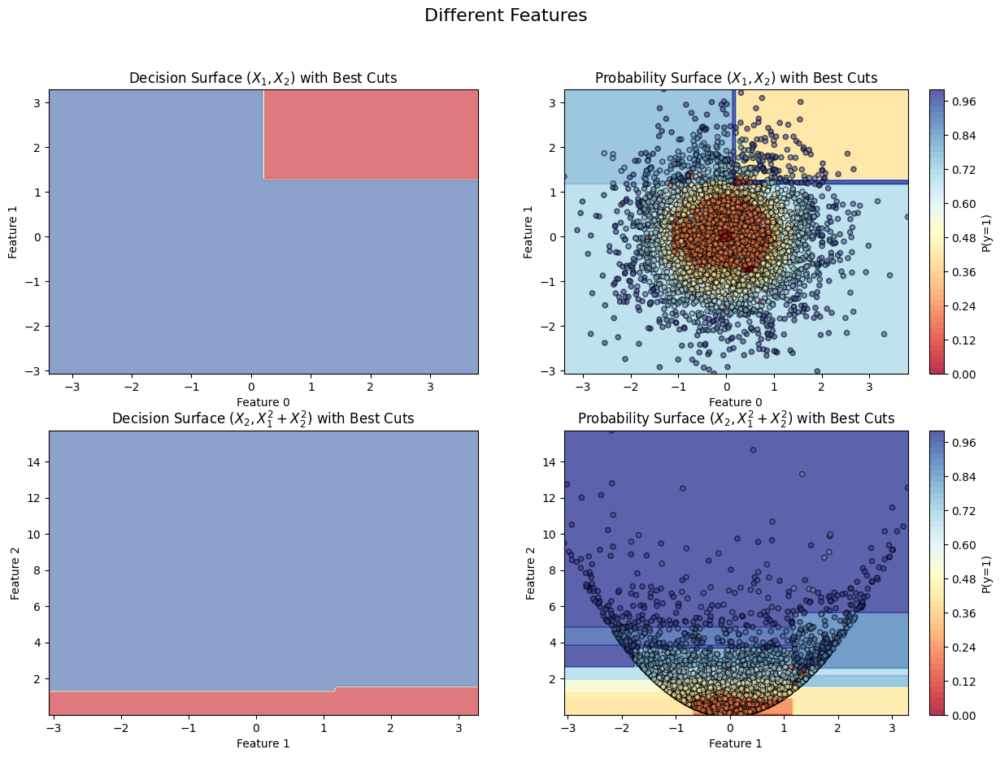

In [17]:
# Subplt for the decision surface and the probability surface
fig, ax = plt.subplots(2, 2, figsize=(15, 10))
# Same feature
lmt.plot_decision_surface_from_fitted_tree(
    composite_tree.CompositeTreeClassifier(trees0, region_conditions0, feature_names=["X1", "X2", "$X_1^2 + X_2^2$"]),
    X_train, (0, 1), ax=ax[0, 0], title="Decision Surface ($X_1, X_2$)")
lmt.plot_decision_surface_from_fitted_tree(
    composite_tree.CompositeTreeClassifier(trees0, region_conditions0, feature_names=["X1", "X2", "$X_1^2 + X_2^2$"]),
    X_train, (1, 2), ax=ax[1, 0], title="Decision Surface ($X_2, X_1^2 + X_2^2$)")
lmt.plot_probability_surface_tree(
    composite_tree.CompositeTreeClassifier(trees0, region_conditions0, feature_names=["X1", "X2", "$X_1^2 + X_2^2$"]),
    X_train, (0, 1), prob_class=1, ax=ax[0, 1], title="Probability Surface ($X_1, X_2$)"
)
lmt.plot_probability_surface_tree(
    composite_tree.CompositeTreeClassifier(trees0, region_conditions0, feature_names=["X1", "X2", "$X_1^2 + X_2^2$"]),
    X_train, (1, 2), prob_class=1, ax=ax[1, 1], title="Probability Surface ($X_2, X_1^2 + X_2^2$)"
)
# General title for the figure
plt.suptitle("Same Feature", fontsize=16)
plt.show()

# Different features
fig, ax = plt.subplots(2, 2, figsize=(15, 10))
lmt.plot_decision_surface_from_fitted_tree(
    composite_tree.CompositeTreeClassifier(trees, region_conditions, feature_names=["X1", "X2", "$X_1^2 + X_2^2$"]),
    X_train, (0, 1), ax=ax[0, 0], title="Decision Surface ($X_1, X_2$) with Best Cuts"
)
lmt.plot_decision_surface_from_fitted_tree(
    composite_tree.CompositeTreeClassifier(trees, region_conditions, feature_names=["X1", "X2", "$X_1^2 + X_2^2$"]),
    X_train, (1, 2), ax=ax[1, 0], title="Decision Surface ($X_2, X_1^2 + X_2^2$) with Best Cuts"
)
lmt.plot_probability_surface_tree(
    composite_tree.CompositeTreeClassifier(trees, region_conditions, feature_names=["X1", "X2", "$X_1^2 + X_2^2$"]),
    X_train, (0, 1), prob_class=1, ax=ax[0, 1], title="Probability Surface ($X_1, X_2$) with Best Cuts"
)
lmt.plot_probability_surface_tree(
    composite_tree.CompositeTreeClassifier(trees, region_conditions, feature_names=["X1", "X2", "$X_1^2 + X_2^2$"]),
    X_train, (1, 2), prob_class=1, ax=ax[1, 1], title="Probability Surface ($X_2, X_1^2 + X_2^2$) with Best Cuts"
)
plt.suptitle("Different Features", fontsize=16)
plt.show()

In [18]:
# Original models
cut_dict0 = composite_tree.find_best_cuts_multiple_per_feature(X_train[:,:2], y_train, max_cuts=2, top_k_per_feature=2, criterion='entropy', n_bins=15)
cut_dict = composite_tree.find_best_cuts_multiple_per_feature(X_train[:,:2], y_train, max_cuts=2, top_k_per_feature=1, criterion='entropy', n_bins=15)

# build trees by region with controlled global depth
trees0, masks0, region_conditions0, feats, thresholds0 = composite_tree.create_root_with_multiple_thresholds(
    X_train[:,:2], y_train, cut_dict=cut_dict0, size='regular'
)
trees, masks, region_conditions, feats, thresholds = composite_tree.create_root_with_multiple_thresholds(
    X_train[:,:2], y_train, cut_dict=cut_dict, size='regular'
)

# Extended models
cut_dict_ext0 = composite_tree.find_best_cuts_multiple_per_feature(X_train, y_train, max_cuts=2, top_k_per_feature=2, criterion='entropy', n_bins=15)
cut_dict_ext = composite_tree.find_best_cuts_multiple_per_feature(X_train, y_train, max_cuts=2, top_k_per_feature=1, criterion='entropy', n_bins=15)
# build trees by region with controlled global depth
trees_ext0, masks_ext0, region_conditions_ext0, feats_ext, thresholds_ext0 = composite_tree.create_root_with_multiple_thresholds(
    X_train, y_train, cut_dict=cut_dict_ext0, size='regular')
trees_ext, masks_ext, region_conditions_ext, feats_ext, thresholds_ext = composite_tree.create_root_with_multiple_thresholds(
    X_train, y_train, cut_dict=cut_dict_ext, size='regular')

clfs_original = [
    composite_tree.CompositeTreeClassifier(trees0, region_conditions0, feature_names=["X1", "X2"]),
    composite_tree.CompositeTreeClassifier(trees, region_conditions, feature_names=["X1", "X2"])
]

clfs_extended = [
    composite_tree.CompositeTreeClassifier(trees_ext0, region_conditions_ext0, feature_names=["X1", "X2", "$X_1^2 + X_2^2$"]),
    composite_tree.CompositeTreeClassifier(trees_ext, region_conditions_ext, feature_names=["X1", "X2", "$X_1^2 + X_2^2$"])
]

In [19]:
from sklearn.calibration import CalibrationDisplay
from matplotlib.gridspec import GridSpec

def plot_combined_calibration_and_hists_for_composites_side_by_side(
    y_test, X_test,
    y_test_ext, X_test_ext,
    clfs_original, clfs_extended,
    model_labels=["Model 0", "Model 1"],
    n_bins=10
):
    """
    Plot calibration curve and two side-by-side histograms for two CompositeTreeClassifier models.
    """
    fig = plt.figure(figsize=(10, 8))
    gs = GridSpec(2, 2, figure=fig, height_ratios=[2, 1])

    ax_curve = fig.add_subplot(gs[0, :])
    ax_hist1 = fig.add_subplot(gs[1, 0])
    ax_hist2 = fig.add_subplot(gs[1, 1])

    colors = plt.get_cmap("tab10")

    # --- Calibration curve ---
    for idx, (clf_o, clf_e) in enumerate(zip(clfs_original, clfs_extended)):
        proba_o = clf_o.predict_proba(X_test)[:, 1]
        proba_e = clf_e.predict_proba(X_test_ext)[:, 1]

        CalibrationDisplay.from_predictions(
            y_test, proba_o, n_bins=n_bins,
            name=f"{model_labels[idx]} - Original",
            ax=ax_curve, color=colors(2 * idx)
        )
        CalibrationDisplay.from_predictions(
            y_test_ext, proba_e, n_bins=n_bins,
            name=f"{model_labels[idx]} - Extended",
            ax=ax_curve, color=colors(2 * idx + 1)
        )

    ax_curve.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Perfect calibration')
    ax_curve.set_title("Calibration Curves for Composite Trees")
    ax_curve.set_xlabel("Mean predicted probability (Positive class: 1)")
    ax_curve.set_ylabel("Fraction of positives")
    ax_curve.grid(True)
    ax_curve.legend(loc='best')

    # --- First histogram (model 0 original vs extended) ---
    proba_0o = clfs_original[0].predict_proba(X_test)[:, 1]
    proba_0e = clfs_extended[0].predict_proba(X_test_ext)[:, 1]
    ax_hist1.hist(proba_0o, bins=n_bins, range=(0, 1), alpha=0.7, color=colors(0), label=f"{model_labels[0]} - Original")
    ax_hist1.hist(proba_0e, bins=n_bins, range=(0, 1), alpha=0.7, color=colors(1), label=f"{model_labels[0]} - Extended")
    ax_hist1.set_title(f"Probability Histogram – {model_labels[0]}")
    ax_hist1.set_xlabel("Predicted probability for class 1")
    ax_hist1.set_ylabel("Count")
    ax_hist1.legend()

    # --- Second histogram (model 1 original vs extended) ---
    proba_1o = clfs_original[1].predict_proba(X_test)[:, 1]
    proba_1e = clfs_extended[1].predict_proba(X_test_ext)[:, 1]
    ax_hist2.hist(proba_1o, bins=n_bins, range=(0, 1), alpha=0.7, color=colors(2), label=f"{model_labels[1]} - Original")
    ax_hist2.hist(proba_1e, bins=n_bins, range=(0, 1), alpha=0.7, color=colors(3), label=f"{model_labels[1]} - Extended")
    ax_hist2.set_title(f"Probability Histogram – {model_labels[1]}")
    ax_hist2.set_xlabel("Predicted probability for class 1")
    ax_hist2.set_ylabel("Count")
    ax_hist2.legend()

    fig.tight_layout()
    plt.show()


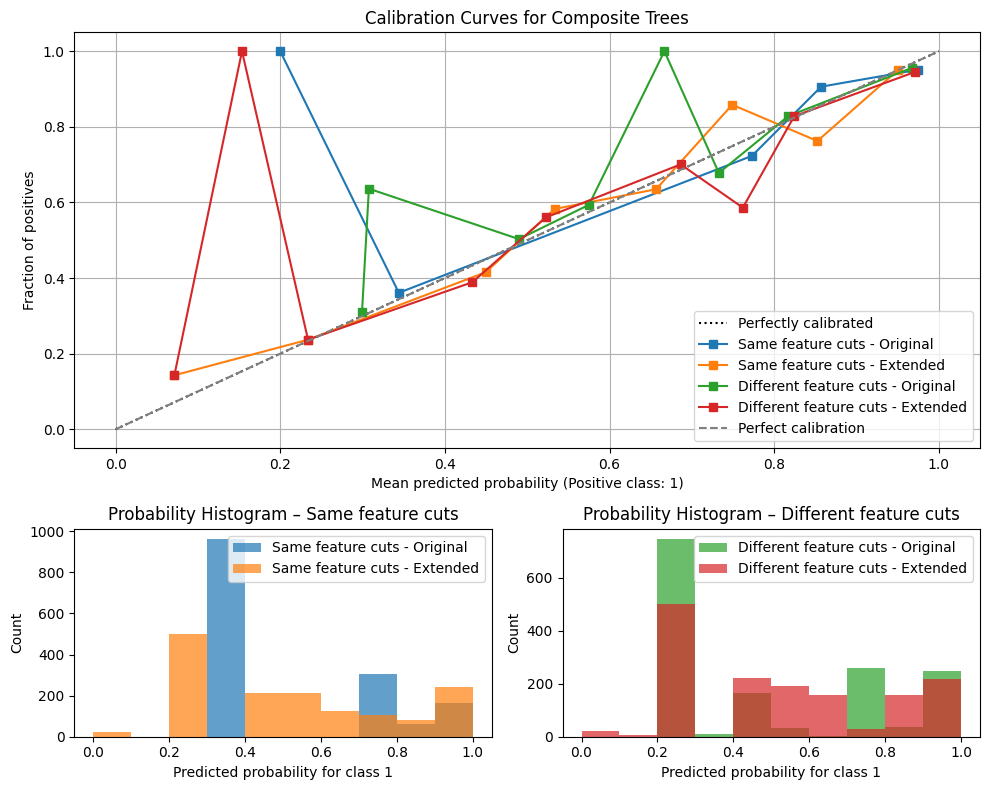

In [20]:
plot_combined_calibration_and_hists_for_composites_side_by_side(
    y_test, X_test[:, :2],
    y_test, X_test,
    clfs_original,
    clfs_extended,
    model_labels=["Same feature cuts", "Different feature cuts"],
    n_bins=10
)

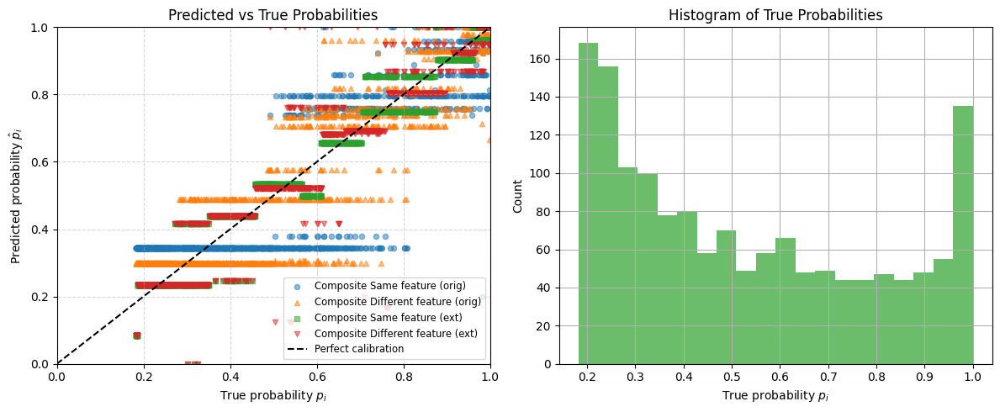

In [21]:
models = {
    "Composite Same feature (orig)": clfs_original[0],
    "Composite Different feature (orig)": clfs_original[1],
    "Composite Same feature (ext)": clfs_extended[0],
    "Composite Different feature (ext)": clfs_extended[1]
}

p_true = expit(alpha * (X_test[:, 0]**2 + X_test[:, 1]**2 - r0))

calibration.plot_pred_vs_true(
    models=models,
    p_true=p_true,
    X_test=X_test,
    model_type='tree',
    orig_cols=2,
    figsize=(12, 5)
)

C:\Users\allis\AppData\Local\Temp\ipykernel_2168\2062219858.py:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = mpl.cm.get_cmap("Spectral", nq)


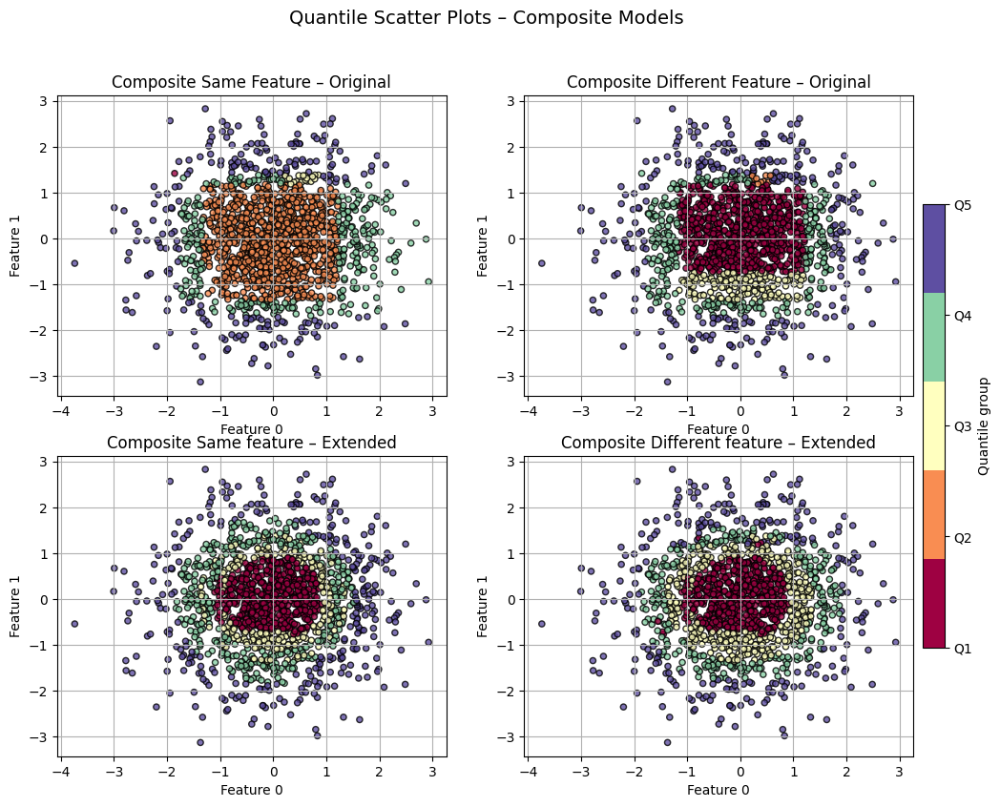

In [22]:
# Obtain predicted probabilities for both sll the four models
y_proba_orig0 = clfs_original[0].predict_proba(X_test[:, :2])[:, 1]
y_proba_orig1 = clfs_original[1].predict_proba(X_test[:, :2])[:, 1]
y_proba_ext0  = clfs_extended[0].predict_proba(X_test)[:,1]
y_proba_ext1  = clfs_extended[1].predict_proba(X_test)[:,1]

# Gather all probabilities
y_proba_orig = np.column_stack((y_proba_orig0, y_proba_orig1))
y_proba_ext = np.column_stack((y_proba_ext0, y_proba_ext1))
# Concatenate all probabilities for quantile calculation    
all_probas = np.concatenate([y_proba_orig, y_proba_ext])

# Definir cuantiles y colores
nq = 5
q_edges = np.quantile(all_probas, np.linspace(0, 1, nq + 1))
norm = mpl.colors.Normalize(vmin=0, vmax=nq - 1)
cmap = mpl.cm.get_cmap("Spectral", nq)

# Crear figura y ejes
fig, axes = plt.subplots(2, 2, figsize=(12, 9))

# Plot modelo original
calibration.plot_scatter_by_quantile(
    X_test[:, :2], y_proba_orig0,
    n_quantiles=nq,
    title="Composite Same Feature – Original",
    ax=axes[0,0],
    feature_1=0,
    feature_2=1,
    cmap=cmap,
    norm=norm,
    q_edges=q_edges
)
calibration.plot_scatter_by_quantile(
    X_test[:, :2], y_proba_orig1,
    n_quantiles=nq,
    title="Composite Different Feature – Original",
    ax=axes[0,1],
    feature_1=0,
    feature_2=1,
    cmap=cmap,
    norm=norm,
    q_edges=q_edges
)


# Plot modelo extendido
calibration.plot_scatter_by_quantile(
    X_test, y_proba_ext0,
    n_quantiles=nq,
    title="Composite Same feature – Extended",
    ax=axes[1,0],
    feature_1=0,
    feature_2=1,
    cmap=cmap,
    norm=norm,
    q_edges=q_edges
)
calibration.plot_scatter_by_quantile(
    X_test, y_proba_ext1,
    n_quantiles=nq,
    title="Composite Different feature – Extended",
    ax=axes[1,1],
    feature_1=0,
    feature_2=1,
    cmap=cmap,
    norm=norm,
    q_edges=q_edges
)

# Colorbar compartido
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])

cbar = fig.colorbar(
    sm,
    ax=axes,
    orientation='vertical',
    fraction=0.025,
    pad=0.01
)
cbar.set_label("Quantile group")
cbar.set_ticks(np.arange(nq))
cbar.set_ticklabels([f"Q{i + 1}" for i in range(nq)])

fig.suptitle("Quantile Scatter Plots – Composite Models", fontsize=14)
plt.show()


### LMT 1

### LMT 2

In [23]:
from scipy import sparse

def fit_logistic_composite_tree_v2(
    X, y,
    cut_dict,
    size='regular',
    pruning=True,
    tree_random_state=0,
    lb_n_estimators=200,
    lb_eps=1e-5,
    lb_cv_splits=5,
    lb_random_state=0
):
    """
    Composite Tree + LogitBoost V2:
    - Use create_root_with_multiple_thresholds to create multiple subtrees by region.
    - Fit SimpleLogistic (LogitBoost with CV) at the root of each region to get M_star.
    - Fit LogitBoost with M_star rounds in all child nodes, warm-starting from parent.
    
    Returns
    -------
    trees          : list of fitted DecisionTreeClassifier, one per region.
    node_models    : dict with key = (region_idx, node_id) and value = {
                        'learners': list of boosting rounds,
                        'J': number of classes,
                        'M_star': int,
                        'cv_errors': np.array or None
                     }
    """
    # Step 1: Build composite tree
    trees, masks, region_conditions, feats, thresholds = composite_tree.create_root_with_multiple_thresholds(
        X, y, cut_dict=cut_dict, size=size
    )

    for i, tree in enumerate(trees):
        print(f"Tree {i} is None? {tree is None}")

    node_models = {}

    # Step 2: Loop over each region (subtree)
    for region_idx, (tree, mask) in enumerate(zip(trees, masks)):
        if tree is None:
            continue

        X_region, y_region = X[mask], y[mask]

        # Step 2.1: Get decision_path matrix for this region’s tree
        node_indicator = tree.decision_path(X_region)

        # Step 2.2: Fit root node (node 0) using SimpleLogistic (with CV)
        root_learners, J_root, M_star, cv_errs = logitboost.simple_logistic_fit(
            X_region, y_region,
            n_estimators=lb_n_estimators,
            eps=lb_eps,
            cv_splits=lb_cv_splits,
            warm_start=None,
            random_state=lb_random_state
        )

        # Step 2.3: Recursively go through the nodes
        def recurse(node_id, warm_start):
            # Get samples passing through this node
            if sparse.issparse(node_indicator):
                sample_mask = node_indicator[:, node_id].toarray().ravel().astype(bool)
            else:
                sample_mask = node_indicator[:, node_id].astype(bool)

            X_node = X_region[sample_mask]
            y_node = y_region[sample_mask]

            if node_id == 0:
                # Use root’s SimpleLogistic result
                learners_node, J_node, cv_err_node = root_learners, J_root, cv_errs
            else:
                # Fit LogitBoost for M_star with warm_start
                learners_node, J_node = logitboost.logitboost_fit(
                    X_node, y_node,
                    n_estimators=M_star,
                    eps=lb_eps,
                    warm_start=warm_start
                )
                cv_err_node = None

            # Store in node_models
            node_models[(region_idx, node_id)] = {
                'learners': learners_node,
                'J': J_node,
                'M_star': M_star,
                'cv_errors': cv_err_node
            }

            # Recurse to children
            left_id = tree.tree_.children_left[node_id]
            right_id = tree.tree_.children_right[node_id]

            if left_id != -1:
                recurse(left_id, warm_start=(learners_node, J_node))
            if right_id != -1:
                recurse(right_id, warm_start=(learners_node, J_node))

        # Start recursion at root node (node 0)
        recurse(0, warm_start=None)

    return trees, node_models, region_conditions, feats, thresholds


In [24]:
# Extended model with 2 cuts in different features
trees, node_models, region_conditions, feats, thresholds = fit_logistic_composite_tree_v2(
    X_train, y_train,
    cut_dict=cut_dict_ext,
    size='regular',
    lb_n_estimators=200,
    lb_cv_splits=5
)

Tree 0 is None? False
Tree 1 is None? False
Tree 2 is None? False
Tree 3 is None? False


In [25]:
def predict_composite_lmt(X, composite_clf, node_models):
    """
    Predict class labels for a Composite Logistic Model Tree.
    
    Parameters
    ----------
    X : array-like of shape (n_samples, n_features)
    composite_clf : CompositeTreeClassifier
        Fitted composite tree.
    node_models : dict
        Dictionary mapping (region_idx, node_id) to fitted LogitBoost models.
        
    Returns
    -------
    preds : np.ndarray of shape (n_samples,)
        Predicted class labels.
    """
    preds = np.empty(len(X), dtype=int)
    assigned = np.zeros(len(X), dtype=bool)

    for region_idx, tree in enumerate(composite_clf.trees):
        if tree is None:
            continue

        # Find samples assigned to this region
        region_mask = composite_clf._region_mask(X, composite_clf.region_conditions[region_idx])
        if not np.any(region_mask):
            continue

        # For these samples, get their leaf node IDs
        X_region = X[region_mask]
        leaf_ids = tree.apply(X_region)

        region_preds = np.empty(len(X_region), dtype=int)
        for i, (x_i, node_id) in enumerate(zip(X_region, leaf_ids)):
            learners = node_models[(region_idx, node_id)]['learners']
            J        = node_models[(region_idx, node_id)]['J']
            p = logitboost.logitboost_predict(x_i.reshape(1, -1), learners, J)
            region_preds[i] = p[0]

        preds[region_mask] = region_preds
        assigned[region_mask] = True

    preds[~assigned] = 0  # default prediction for unassigned
    return preds


def predict_proba_composite_lmt(X, composite_clf, node_models):
    """
    Predict class probabilities for a Composite Logistic Model Tree.

    Parameters
    ----------
    X : array-like of shape (n_samples, n_features)
    composite_clf : CompositeTreeClassifier
        Fitted composite tree.
    node_models : dict
        Dictionary mapping (region_idx, node_id) to fitted LogitBoost models.
        
    Returns
    -------
    proba_matrix : np.ndarray of shape (n_samples, max_J)
        Predicted probabilities for each sample.
    """
    # Find max number of classes
    max_J = max(model['J'] for model in node_models.values())
    probas = np.zeros((len(X), max_J), dtype=float)
    assigned = np.zeros(len(X), dtype=bool)

    for region_idx, tree in enumerate(composite_clf.trees):
        if tree is None:
            continue

        region_mask = composite_clf._region_mask(X, composite_clf.region_conditions[region_idx])
        if not np.any(region_mask):
            continue

        X_region = X[region_mask]
        leaf_ids = tree.apply(X_region)

        region_probas = np.zeros((len(X_region), max_J), dtype=float)
        for i, (x_i, node_id) in enumerate(zip(X_region, leaf_ids)):
            model = node_models[(region_idx, node_id)]
            p = logitboost.logitboost_predict_proba(x_i.reshape(1, -1), model['learners'], model['J'])
            region_probas[i, :model['J']] = p[0]

        probas[region_mask] = region_probas
        assigned[region_mask] = True

    return probas


In [26]:
clf_ext = composite_tree.CompositeTreeClassifier(
    trees=trees,
    region_conditions=region_conditions,
    feature_names=["X1", "X2", "$X_1^2 + X_2^2$"]  # adjust if needed
)

# Predict class labels using the composite logistic model tree
y_pred = predict_composite_lmt(X_test, clf_ext, node_models)

# Accuracy
acc_ext = accuracy_score(y_test, y_pred)
print(f"Accuracy (Extended Model): {acc_ext:.4f}")

Accuracy (Extended Model): 0.6773


In [27]:
y_pred.shape

(1500,)

In [28]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from sklearn.tree import plot_tree
import numpy as np
import re

def plot_tree_with_linear_models_grid_improved(
    trees,
    region_conditions,
    node_models_list,
    X,
    feature_names=None,
    title="Composite Tree with LogitBoost Models",
    model_threshold=1e-6,
    show_internal=False  # <--- NEW toggle
):
    num_trees = len(trees)
    cols = min(2, num_trees)
    rows = (num_trees + cols - 1) // cols

    fig = plt.figure(figsize=(10 * cols, 3 + 6 * rows))
    ax_root = plt.subplot2grid((rows + 1, cols), (0, 0), colspan=cols)
    ax_root.axis('off')

    # Root label
    ax_root.text(0.5, 0.8, "Root Node", ha='center', va='center',
                 bbox=dict(boxstyle="round,pad=0.3", fc="lightgray", ec="black"), fontsize=14)

    x_positions = np.linspace(0.1, 0.9, num_trees)

    for i, (tree, conds) in enumerate(zip(trees, region_conditions)):
        if tree is None:
            continue

        cond_label = " ∧ ".join([
            f"{feature_names[f] if feature_names else f'X{f}'} ∈ ({low:.2f}, {high:.2f}]" 
            for (f, low, high) in conds
        ])

        ax_root.annotate("",
                         xy=(x_positions[i], 0.55), xycoords='axes fraction',
                         xytext=(0.5, 0.75), textcoords='axes fraction',
                         arrowprops=dict(arrowstyle="->", lw=1.5))
        ax_root.text(x_positions[i], 0.45, cond_label,
                     ha='center', va='top', fontsize=10,
                     bbox=dict(boxstyle="round,pad=0.3", fc="lightblue", ec="black"))

        r, c = divmod(i, cols)
        ax_sub = plt.subplot2grid((rows + 1, cols), (r + 1, c))

        node_models = node_models_list[i]
        n_features = X.shape[1]
        feature_labels = feature_names if feature_names else [f"x[{k}]" for k in range(n_features)]

        intercepts_dict = {}
        coefs_dict = {}
        for nid, mdl in node_models.items():
            ints, cos = logitboost.extract_linear_models(mdl['learners'], mdl['J'], n_features)
            intercepts_dict[nid] = ints
            coefs_dict[nid] = cos

        plot_tree(
            tree,
            feature_names=feature_labels,
            filled=True,
            node_ids=True,
            ax=ax_sub,
            fontsize=8
        )

        # Find leaf ids
        tree_ = tree.tree_
        leaf_ids = [j for j in range(tree_.node_count) if tree_.children_left[j] == -1]

        for txt in ax_sub.texts:
            full = txt.get_text()
            first_line = full.split("\n", 1)[0]
            m = re.search(r'\b(\d+)\b', first_line)
            if not m:
                continue
            node_id = int(m.group(1))
            if not show_internal and node_id not in leaf_ids:
                continue

            ints = intercepts_dict.get(node_id)
            cos = coefs_dict.get(node_id)
            if ints is None or cos is None:
                continue

            J = len(ints)
            lines = []
            for j in range(J):
                b = ints[j]
                parts = [f"F{j}(x)={b:.2f}"]
                for k in range(n_features):
                    a = cos[j, k]
                    if abs(a) > model_threshold:
                        parts.append(f"{'+' if a>=0 else '-'}{abs(a):.2f}*x[{k}]")
                lines.append(" ".join(parts))
            txt.set_text(full + "\n" + "\n".join(lines))

        ax_sub.set_title(f"Tree #{i}", fontsize=12)

    fig.suptitle(title, fontsize=16, y=0.95)
    plt.tight_layout()
    plt.show()


In [29]:
for i, tree in enumerate(clf_ext.trees):
    print(f"Tree #{i} is None? {tree is None}")


Tree #0 is None? False
Tree #1 is None? False
Tree #2 is None? False
Tree #3 is None? False


In [30]:
from typing import List, Dict, Tuple
import numpy as np


def split_node_models_by_tree(node_models, n_trees):
    """
    Transforma un dict {(region_id, node_id): model, ...} a una lista de dicts por árbol.
    """
    models_list = [{} for _ in range(n_trees)]
    for (region_id, node_id), model in node_models.items():
        models_list[region_id][node_id] = model
    return models_list



# Suppose `node_models` comes from your fit_logistic_composite_tree_v2()
node_models_list = split_node_models_by_tree(node_models, n_trees=len(trees))



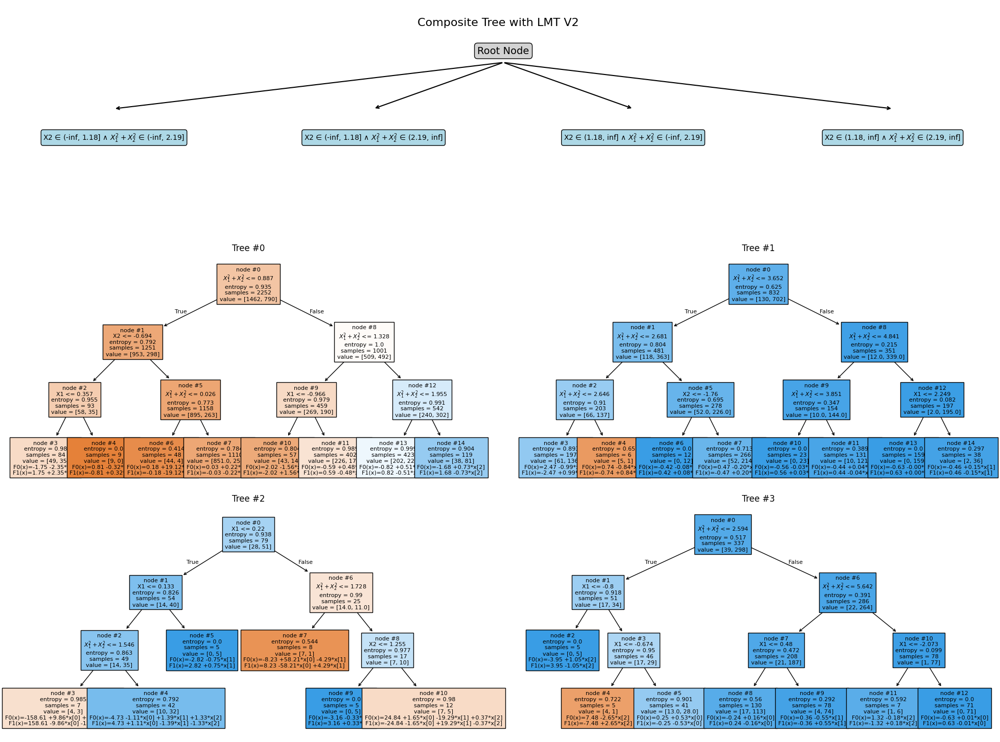

In [31]:
plot_tree_with_linear_models_grid_improved(
    trees=trees,
    region_conditions=region_conditions,
    node_models_list=node_models_list,  # result of your split_node_models_by_tree()
    X=X_train,
    feature_names=["X1", "X2", "$X_1^2 + X_2^2$"],
    title="Composite Tree with LMT V2",
    show_internal=False
)



In [32]:
def plot_decision_regions_lmt(
    X,
    y,
    clf_lmt,
    nodes_lmt,
    feature_pair=(0, 1),
    fill_value="mean",       # "mean" | "median" | float
    grid_steps=200,
    cmap='RdYlBu',
    ax=None,
    title="Decision regions (LMT)",
    show_scatter=True
):
    """
    Plots the 2D decision regions of an LMT model using its class predictions.

    Parameters
    ----------
    X : array, shape (n_samples, D)
        Full dataset.
    y : array, shape (n_samples,)
        True labels (0 … J-1), used for overlay and J=number of classes.
    clf_lmt : object
        The fitted tree from fit_logistic_model_tree.
    nodes_lmt : object
        The nodes/models returned alongside clf_lmt.
    feature_pair : tuple(int i, int j)
        Which two features to plot on the x- and y-axes.
    fill_value : "mean" | "median" | float
        How to fill the other dimensions (3…D) when building the grid.
    grid_steps : int
        Resolution of the background grid.
    cmap : Colormap
        A discrete colormap, e.g. plt.cm.Paired.
    ax : matplotlib Axes, optional
    title : str
    """
    i, j = feature_pair
    D = X.shape[1]
    classes = np.unique(y)
    J = len(classes)

    # 1) build a grid over features i vs j
    x_min, x_max = X[:, i].min() - 1, X[:, i].max() + 1
    y_min, y_max = X[:, j].min() - 1, X[:, j].max() + 1
    xx, yy = np.meshgrid(
        np.linspace(x_min, x_max, grid_steps),
        np.linspace(y_min, y_max, grid_steps)
    )
    grid_pts = np.c_[xx.ravel(), yy.ravel()]
    n_grid = grid_pts.shape[0]

    # 2) lift grid back into full D-space
    if fill_value == "mean":
        default = X.mean(axis=0)
    elif fill_value == "median":
        default = np.median(X, axis=0)
    else:
        default = np.full(D, float(fill_value))

    X_grid = np.tile(default, (n_grid, 1))
    X_grid[:, i] = grid_pts[:, 0]
    X_grid[:, j] = grid_pts[:, 1]

    # 3) predict classes on the grid
    Z_flat = predict_composite_lmt(X_grid, clf_lmt, nodes_lmt)

    Z = Z_flat.reshape(xx.shape)

    # 4) plot the decision regions
    if ax is None:
        fig, ax = plt.subplots(figsize=(8, 6))

    # discrete boundaries at class midpoints: e.g. [-0.5, 0.5, 1.5] for J=2
    levels = np.arange(J+1) - 0.5
    cf = ax.contourf(
        xx, yy, Z,
        levels=levels,
        cmap=cmap,
        alpha=0.3
    )

    # 5) overlay the true points by their true label in matching colors
    if show_scatter:
        # use the colormap to get colors for each class
        norm = cf.norm
        cmap_used = cf.cmap
        for cls in classes:
            mask = (y == cls)
            color = cmap_used(norm(cls))
            # sc = ax.scatter(
            #     X[mask, i], X[mask, j],
            #     color=color,
            #     s=20,
            #     label=f'class {cls}'
            # )
            sc = ax.scatter(
                X[mask, i], X[mask, j],
                c=[cls] * np.sum(mask),
                cmap=cmap_used,
                norm=norm,
                s=20,
                edgecolor='k',
                linewidth=0.3
            )
            # discrete legend
        handles, _ = sc.legend_elements()
        ax.legend(handles, [f"class {c}" for c in classes], loc="lower right")
        # ax.legend(loc='lower right')

    

    # 6) labels & title & legend
    ax.set_xlabel(f"Feature {i}")
    ax.set_ylabel(f"Feature {j}")
    ax.set_title(title)

    
    


    return ax, cf

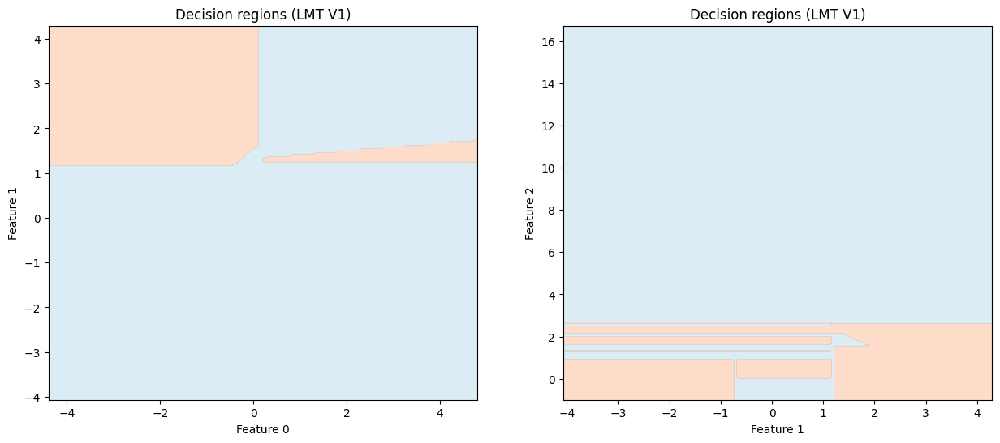

In [33]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
# Plot decision regions for the extended model
plot_decision_regions_lmt(
    X_train,
    y_train,
    clf_lmt=clf_ext,
    nodes_lmt=node_models,
    feature_pair=(0, 1),
    fill_value="mean",
    grid_steps=200,
    cmap='RdYlBu',
    ax=ax[0],
    title="Decision regions (LMT V1)",
    show_scatter=False
)
plot_decision_regions_lmt(
    X_train,
    y_train,
    clf_lmt=clf_ext,
    nodes_lmt=node_models,
    feature_pair=(1, 2),
    fill_value="mean",
    grid_steps=200,
    cmap='RdYlBu',
    ax=ax[1],
    title="Decision regions (LMT V1)",
    show_scatter=False
)
plt.show()

In [34]:
def plot_probability_surface_lmt(
    clf_lmt,
    nodes_lmt,
    X,
    feature_pair,
    prob_class=1,
    fixed_vals=None,
    grid_steps=200,
    cmap='RdYlBu',
    ax=None,
    title='Predicted probability surface (LMT)',
    show_scatter=True
):
    """
    Plots a 2D probability surface from your LMT model, colouring each
    point by P(y = prob_class) ∈ [0,1], and overlays the training points
    coloured by their own predicted probability.

    Parameters
    ----------
    clf_lmt : the object returned by fit_logistic_model_tree (e.g. clf_shallow_ext)
    nodes_lmt : the nodes structure returned alongside clf_lmt
    X : array-like, shape (n_samples, n_features)
    feature_pair : tuple of two ints (i, j), indices of features to plot
    prob_class : int, default=1
        Which class’s probability to display (0 or 1)
    fixed_vals : array-like of shape (n_features,), optional
        Values to hold the “unused” features at. Defaults to X.mean(axis=0).
    grid_steps : int, default=200
        Resolution of the background grid.
    cmap : str or Colormap, default='RdYlBu'
    ax : matplotlib Axes, optional
    title : str

    Returns
    -------
    ax : matplotlib Axes
    contour : QuadContourSet
    """
    i, j = feature_pair

    # 1) build grid in feature‐i vs feature‐j space
    x_min, x_max = X[:, i].min(), X[:, i].max()
    y_min, y_max = X[:, j].min(), X[:, j].max()
    xx, yy = np.meshgrid(
        np.linspace(x_min, x_max, grid_steps),
        np.linspace(y_min, y_max, grid_steps)
    )

    # 2) lift grid back into full feature space
    if fixed_vals is None:
        fixed_vals = X.mean(axis=0)
    base = np.tile(fixed_vals, (xx.size, 1))
    base[:, i] = xx.ravel()
    base[:, j] = yy.ravel()

    # 3) get probs from your LMT
    Z_flat = predict_proba_composite_lmt(base, clf_lmt, nodes_lmt)[:, prob_class]
    Z_flat = np.clip(Z_flat, 0, 1)  # ensure probabilities are in [0, 1]
    Z = Z_flat.reshape(xx.shape)

    # 4) plot the continuous surface
    if ax is None:
        fig, ax = plt.subplots(figsize=(6,5))
    
    levels = np.linspace(0, 1, 51)
    contour = ax.contourf(
        xx, yy, Z,
        levels=levels,
        cmap=cmap,
        vmin=0, vmax=1,
        alpha=0.8
    )
    #contour.set_clim(0, 1)
    cbar = plt.colorbar(contour, ax=ax, label=f'P(y={prob_class})')

    # 5) overlay the actual points, coloured by their own prob
    if show_scatter:
        point_probs = predict_proba_composite_lmt(X, clf_lmt, nodes_lmt)[:, prob_class]
        point_probs = np.clip(point_probs, 0, 1)  # ensure probabilities are in [0, 1]
        ax.scatter(
            X[:, i], X[:, j],
            c=point_probs,
            cmap=cmap,
            vmin=0, vmax=1,
            edgecolor='k',
            s=20,
            alpha=0.6
        )

    # 6) labels & title
    ax.set_xlabel(f'Feature {i}')
    ax.set_ylabel(f'Feature {j}')
    ax.set_title(title)

    return ax, contour

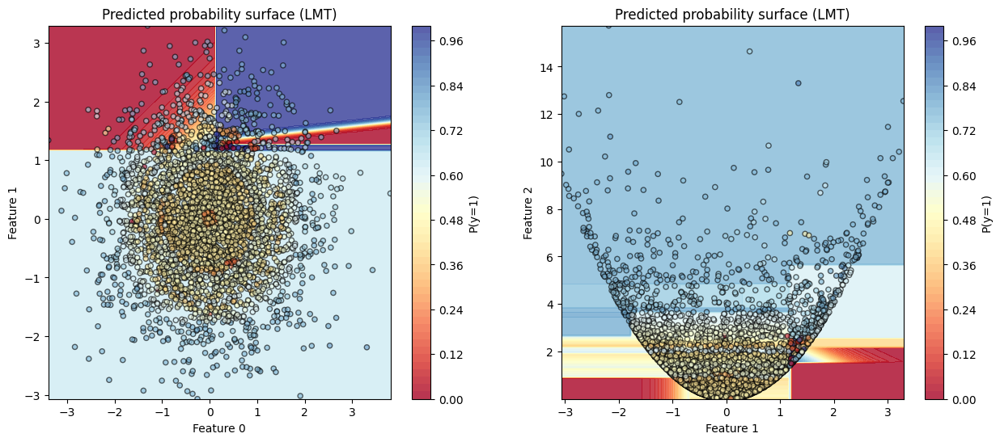

In [35]:

fig, ax = plt.subplots(1, 2, figsize=(15, 6))
# Plot decision regions for the extended model
plot_probability_surface_lmt(
    clf_lmt=clf_ext,
    nodes_lmt=node_models,
    X=X_train,
    feature_pair=(0,1),
    prob_class=1,
    fixed_vals=None,
    grid_steps=200,
    cmap='RdYlBu',
    ax=ax[0],
    title='Predicted probability surface (LMT)',
    show_scatter=True
)

plot_probability_surface_lmt(
    clf_lmt=clf_ext,
    nodes_lmt=node_models,
    X=X_train,
    feature_pair=(1,2),
    prob_class=1,
    fixed_vals=None,
    grid_steps=200,
    cmap='RdYlBu',
    ax=ax[1],
    title='Predicted probability surface (LMT)',
    show_scatter=True
)

plt.show()

In [36]:
# Calibration curves and histograms for the extended model
from sklearn.calibration import CalibrationDisplay
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

def plot_calibration_curve_composite_lmt(
    X_test, y_test,
    composite_clf,
    node_models,
    n_bins=10,
    title="Calibration Curve – Composite LMT",
    model_label="Composite LMT",
    figsize=(10, 5)
):
    """
    Plots a calibration curve and histogram for a CompositeTreeClassifier with LogitBoost models at each node.

    Parameters:
    -----------
    X_test : array-like, shape (n_samples, n_features)
        Test features.
    y_test : array-like, shape (n_samples,)
        True labels (binary).
    composite_clf : CompositeTreeClassifier
        Trained composite tree classifier.
    node_models : dict
        Dictionary of fitted LogitBoost models per node.
    n_bins : int
        Number of bins to use for calibration plot.
    title : str
        Title for the entire plot.
    model_label : str
        Label to use in the legend.
    figsize : tuple
        Size of the full figure.
    """
    import matplotlib.cm as cm
    cmap = cm.get_cmap("tab10")

    # 1. Predict probabilities
    proba_pred = composite_tree.predict_proba_composite_lmt(X_test, composite_clf, node_models)[:, 1]

    # 2. Create subplots using GridSpec
    fig = plt.figure(figsize=figsize)
    gs = gridspec.GridSpec(1, 2, width_ratios=[2, 1])

    ax_calib = fig.add_subplot(gs[0])
    ax_hist = fig.add_subplot(gs[1])

    # 3. Calibration curve
    CalibrationDisplay.from_predictions(
        y_test,
        proba_pred,
        n_bins=n_bins,
        ax=ax_calib,
        name=model_label,
        color=cmap(0)
    )
    ax_calib.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Perfect calibration')
    ax_calib.set_title("Calibration Curve")
    ax_calib.set_xlabel("Mean predicted probability")
    ax_calib.set_ylabel("Fraction of positives")
    ax_calib.legend()
    ax_calib.grid(True)

    # 4. Histogram
    ax_hist.hist(proba_pred, bins=n_bins, range=(0, 1), alpha=0.8, color=cmap(0))
    ax_hist.set_title("Histogram")
    ax_hist.set_xlabel("Predicted probability")
    ax_hist.set_ylabel("Count")

    fig.suptitle(title)
    plt.tight_layout()
    plt.show()


C:\Users\allis\AppData\Local\Temp\ipykernel_2168\4040988463.py:38: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("tab10")


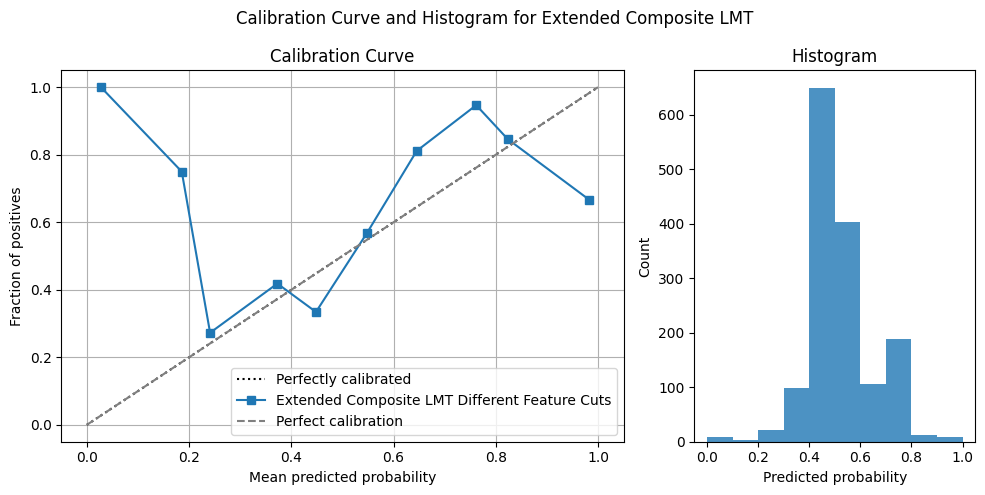

In [37]:
plot_calibration_curve_composite_lmt(
    X_test=X_test,
    y_test=y_test,
    composite_clf=clf_ext,
    node_models=node_models,
    n_bins=10,
    title="Calibration Curve and Histogram for Extended Composite LMT",
    model_label="Extended Composite LMT Different Feature Cuts"
)


In [38]:
def plot_pred_vs_true(
    models: dict,
    p_true: np.ndarray,
    X_test: np.ndarray,
    model_type: str = 'tree',
    orig_cols: int = 2,
    figsize: tuple = (12, 5)
):
    """
    models: 
      - if model_type=='tree': { name: clf, ... }
      - if model_type=='lmt' : { name: (clf, nodes), ... }
      - if model_type=='logitboost': { name: (learners, J), ... }
      - if model_type=='composite' : { name: (clf, nodes), ... }
    p_true: array of true probabilities, shape (n_samples,)
    X_test: feature matrix, shape (n_samples, n_features)
    model_type: 'tree', 'lmt' or 'logitboost'
    orig_cols: how many cols from X_test to use for models tagged as '(orig)'
    """
    import matplotlib.cm as cm
    colors = cm.get_cmap("tab10")
    markers = ['o', '^', 's', 'v', '<', '>', 'X', 'D']

    # Create shared subplots for all models
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)

    for idx, ((name, val), marker) in enumerate(zip(models.items(), markers)):
        # Get X subset based on model name
        X_in = X_test[:, :orig_cols] if '(orig)' in name else X_test

        # Predict based on model type
        if model_type == 'tree':
            clf = val
            y_pred = clf.predict_proba(X_in)[:, 1]
        elif model_type == 'lmt':
            clf, nodes = val
            y_pred = lmt.predict_proba_lmt(X_in, clf, nodes)
        elif model_type == 'logitboost':
            learners, J = val
            y_pred = logitboost.logitboost_predict_proba(X_in, learners, J)[:, 1]
        elif model_type == 'composite':
            clf, nodes = val
            y_pred = predict_proba_composite_lmt(X_in, clf, nodes)[:, 1]
        else:
            raise ValueError("model_type must be 'tree', 'lmt', or 'logitboost'")

        # Scatter plot
        ax1.scatter(
            p_true, y_pred,
            alpha=0.5, s=20,
            marker=marker,
            label=name,
            color=colors(idx % 10)
        )

    # Perfect calibration line
    ax1.plot([0, 1], [0, 1], 'k--', label='Perfect calibration')
    ax1.set_xlim([0, 1])
    ax1.set_ylim([0, 1])
    ax1.set_xlabel("True probability $p_i$")
    ax1.set_ylabel("Predicted probability $\hat p_i$")
    ax1.set_title("Predicted vs True Probabilities")
    ax1.grid(True, linestyle='--', alpha=0.5)
    ax1.legend(loc='lower right', fontsize='small')

    # Histogram of true probabilities
    ax2.hist(p_true, bins=20, color=colors(2), alpha=0.7)
    ax2.set_title("Histogram of True Probabilities")
    ax2.set_xlabel("True probability $p_i$")
    ax2.set_ylabel("Count")
    ax2.grid(True)

    plt.tight_layout()
    plt.show()

C:\Users\allis\AppData\Local\Temp\ipykernel_2168\3897220414.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap("tab10")


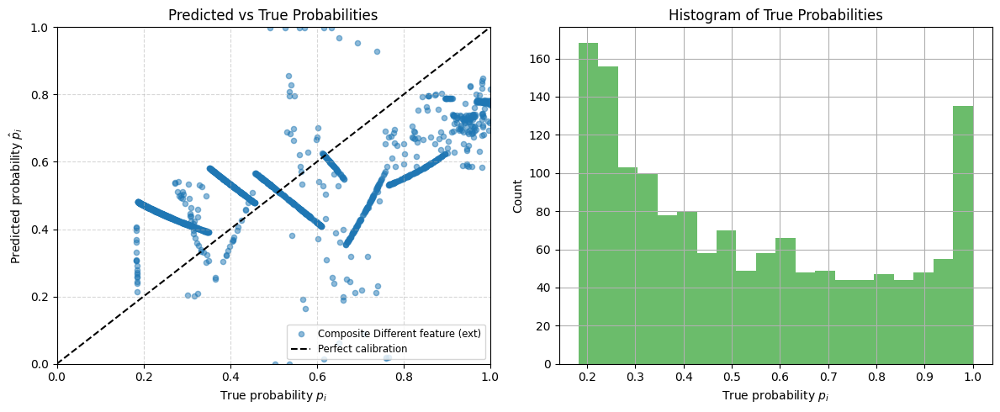

In [39]:
plot_pred_vs_true(
    models={"Composite Different feature (ext)": (clf_ext, node_models)},
    p_true=p_true,
    X_test=X_test,
    model_type='composite',
    orig_cols=2,
    figsize=(12, 5)
)
plt.show()

C:\Users\allis\AppData\Local\Temp\ipykernel_2168\1633661337.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = mpl.cm.get_cmap("Spectral", nq)


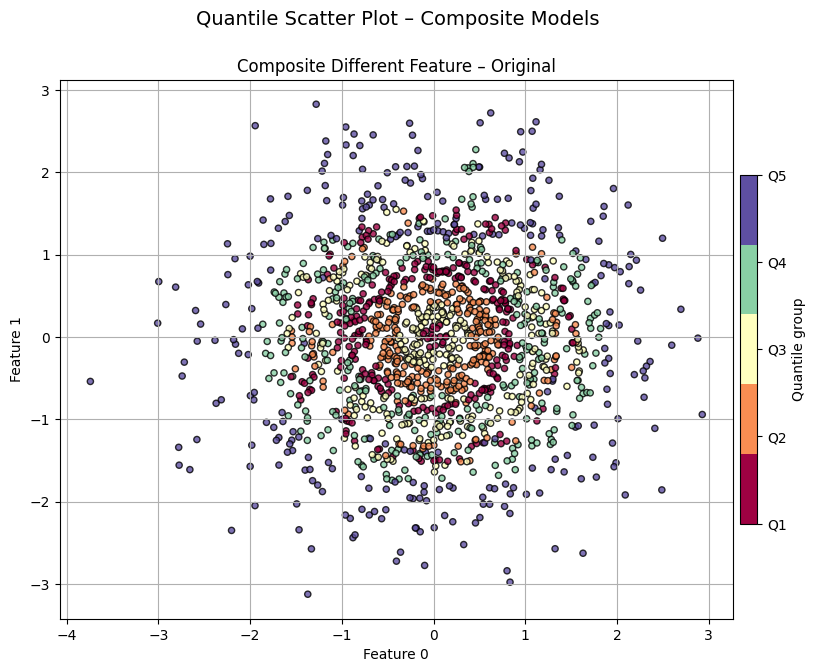

In [40]:
# Obtain predicted probabilities for both sll the four models
y_proba_orig0 = composite_tree.predict_proba_composite_lmt(X_test, clf_ext, node_models)[:, 1]

# Definir cuantiles y colores
nq = 5
q_edges = np.quantile(y_proba_orig0, np.linspace(0, 1, nq + 1))
norm = mpl.colors.Normalize(vmin=0, vmax=nq - 1)
cmap = mpl.cm.get_cmap("Spectral", nq)

fig, axes = plt.subplots(1, 1, figsize=(9, 7))
# Plot modelo original
calibration.plot_scatter_by_quantile(
    X_test[:, :2], y_proba_orig0,
    n_quantiles=nq,
    title="Composite Different Feature – Original",
    feature_1=0,
    feature_2=1,
    ax=axes,
    cmap=cmap,
    norm=norm,
    q_edges=q_edges
)

# Colorbar compartido
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])

cbar = fig.colorbar(
    sm,
    ax=axes,  # or replace ax1 with the correct axes variable
    orientation='vertical',
    fraction=0.025,
    pad=0.01
)

cbar.set_label("Quantile group")
cbar.set_ticks(np.arange(nq))
cbar.set_ticklabels([f"Q{i + 1}" for i in range(nq)])

fig.suptitle("Quantile Scatter Plot – Composite Models", fontsize=14)
plt.show()

## Absolute value dataset

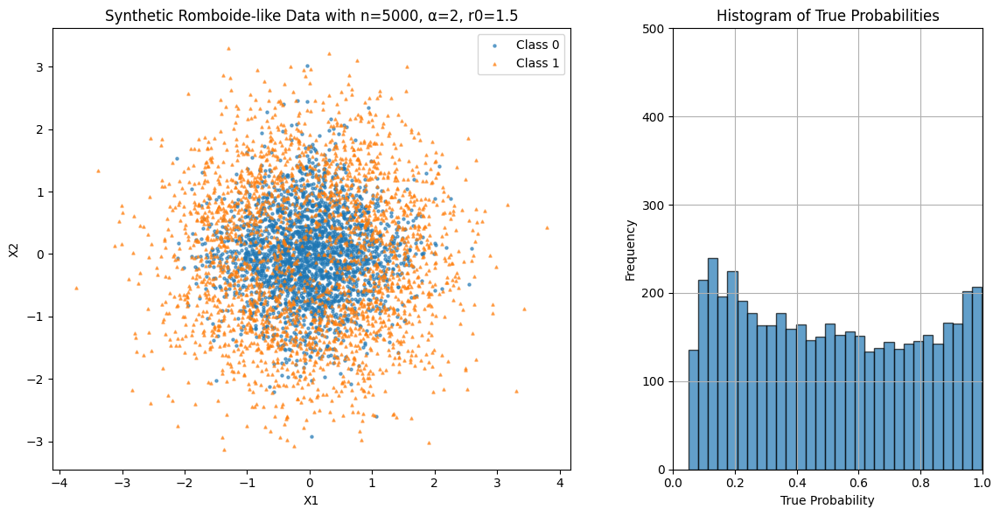

Proportion of positive samples: 0.50


In [41]:
# 1) PARAMETERS
n = 5000
alpha = 2 # controls sharpness of the circle boundary
r0 = 1.5   # target radius

# 2) SIMULATE FEATURES from a normal distribution
np.random.seed(0)  # for reproducibility
X1 = np.random.normal(0, 1, n)
X2 = np.random.normal(0, 1, n)
r2 = np.abs(X1) + np.abs(X2)  # r^2 = |X1| + |X2|

# 3) DEFINE TRUE PROBABILITIES USING A SIGMOID ON r^2 - r0
p = 1 / (1 + np.exp(-alpha * (r2 - r0)))

# 4) SAMPLE OUTCOME y ~ Bernoulli(p)
y = np.random.binomial(1, p)


# Subplots for the scatter plot and the histogram
fig = plt.figure(figsize=(12, 6))
gs = GridSpec(1, 2, width_ratios=[2, 1])

# a) SCATTER PLOT
classes = np.unique(y)
ax1 = fig.add_subplot(gs[0])
ax1.set_title(f'Synthetic Romboide-like Data with n={n}, α={alpha}, r0={r0}')
ax1.set_xlabel('X1')
ax1.set_ylabel('X2')
# Plot the points with different markers for each class
for cls, marker in zip(classes, ['o', '^']):
    ax1.scatter(
        X1[y==cls], 
        X2[y==cls], 
        alpha=0.6, 
        marker=marker, 
        label=f'Class {int(cls)}',
        s=5
    )
ax1.legend()

# b) HISTOGRAM OF PROBABILITIES
ax2 = fig.add_subplot(gs[1])
ax2.set_title('Histogram of True Probabilities')
ax2.set_xlabel('True Probability')
ax2.set_ylabel('Frequency')
ax2.hist(p, bins=30, alpha=0.7, edgecolor='black')
ax2.grid()
# Show the plots in equal proportions without blank spaces
ax2.set_xlim(0, 1)
ax2.set_ylim(0, 500)
ax2.set_aspect('auto', adjustable='box')
ax1.set_aspect('equal', adjustable='box')
plt.tight_layout()
plt.show()

# Proportion of positive samples
positive_proportion = np.mean(y)
print(f"Proportion of positive samples: {positive_proportion:.2f}")

In [42]:
# Full dataset
X = np.column_stack((X1, X2))   # now X has shape (n,2)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

### Composite Trees

ORIGINAL DATASET
Best cuts found (same feature): {0: [-1.170885347382412], 1: [-1.1791298325347532]}
Best cuts found (different features): {0: [-1.170885347382412], 1: [-1.1791298325347532]}

Best 2 cuts (same feature)
Train accuracy: 0.73, Test accuracy: 0.72

Best 2 cuts (different features)
Train accuracy: 0.73, Test accuracy: 0.72


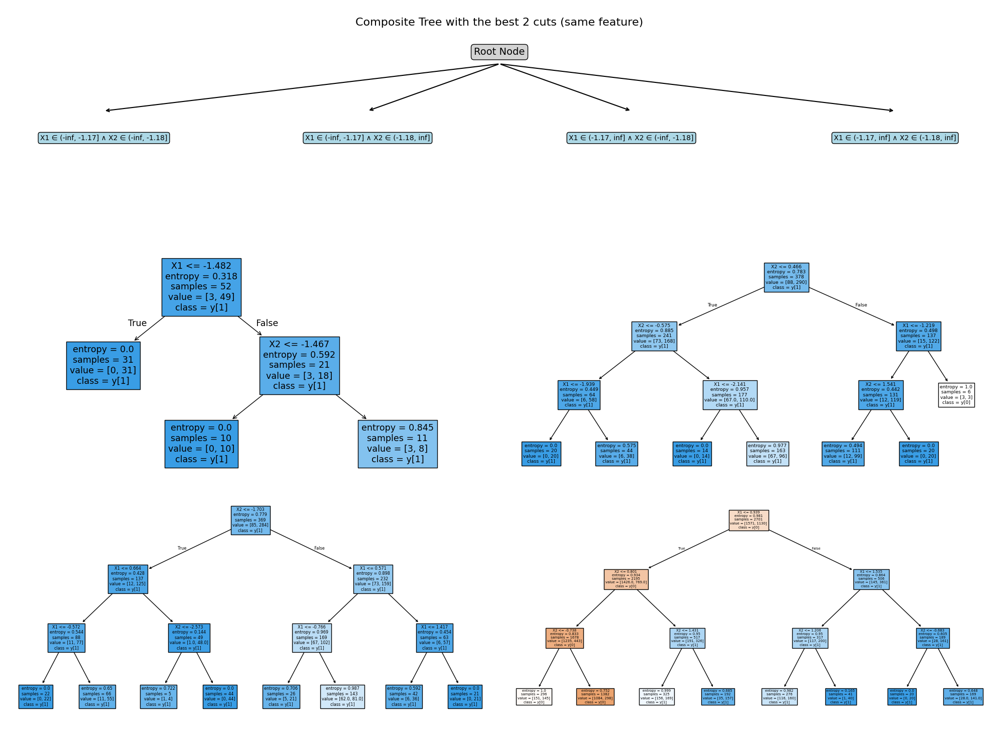

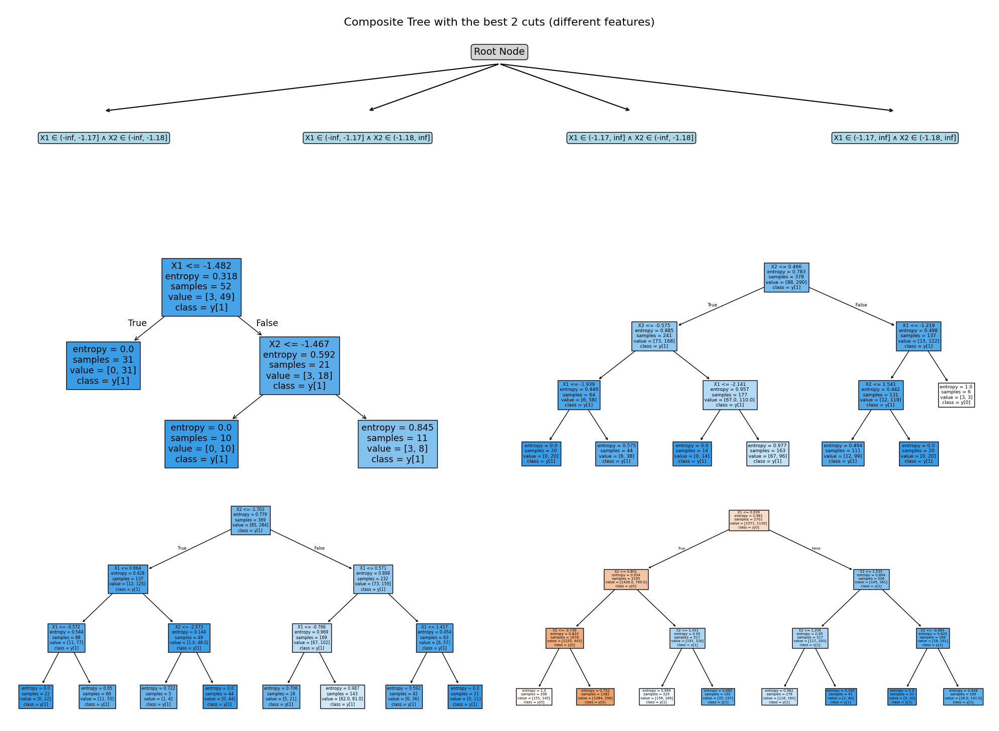

In [43]:
print("ORIGINAL DATASET")
# Find best cuts in general
cut_dict0 = composite_tree.find_best_cuts_multiple_per_feature(
    X_train[:, :2], y_train,
    max_cuts=2,
    top_k_per_feature=2,
    criterion='entropy',
    n_bins=15
)
print("Best cuts found (same feature):", cut_dict0)

# Find best cuts in X1 and X2 to build the root node
cut_dict = composite_tree.find_best_cuts_multiple_per_feature(X_train[:, :2], y_train, max_cuts=2, top_k_per_feature=1, criterion='entropy', n_bins=15)
print("Best cuts found (different features):", cut_dict)

# build trees by region with controlled global depth
trees0, masks0, region_conditions0, feats, thresholds0 = composite_tree.create_root_with_multiple_thresholds(
    X_train[:, :2], y_train, cut_dict=cut_dict0, size='regular'
)
trees, masks, region_conditions, feats, thresholds = composite_tree.create_root_with_multiple_thresholds(
    X_train[:, :2], y_train, cut_dict=cut_dict, size='regular'
)

# get acccuracy on training and test sets
print("\nBest 2 cuts (same feature)")
train_acc0, train_preds0, train_assigned0 = composite_tree.evaluate_forest_with_intervals(trees0, X_train[:, :2], y_train, region_conditions0)
test_acc0, test_preds0, test_assigned0 = composite_tree.evaluate_forest_with_intervals(trees0, X_test[:, :2], y_test, region_conditions0)
print(f"Train accuracy: {train_acc0:.2f}, Test accuracy: {test_acc0:.2f}")

print("\nBest 2 cuts (different features)")
train_acc, train_preds, train_assigned = composite_tree.evaluate_forest_with_intervals(trees, X_train[:, :2], y_train, region_conditions)
test_acc, test_preds, test_assigned = composite_tree.evaluate_forest_with_intervals(trees, X_test[:, :2], y_test, region_conditions)
print(f"Train accuracy: {train_acc:.2f}, Test accuracy: {test_acc:.2f}")

# Plot the first tree with the best 2 cuts (same feature)
composite_tree.visualize_root_and_subtrees_grid_with_intervals(
    trees0,
    region_conditions0,
    feature_names=["X1", "X2"],
    title="Composite Tree with the best 2 cuts (same feature)"
)
# Plot the second tree with the best 2 cuts (different features)
composite_tree.visualize_root_and_subtrees_grid_with_intervals(
    trees,
    region_conditions,
    feature_names=["X1", "X2"],
    title="Composite Tree with the best 2 cuts (different features)"
)


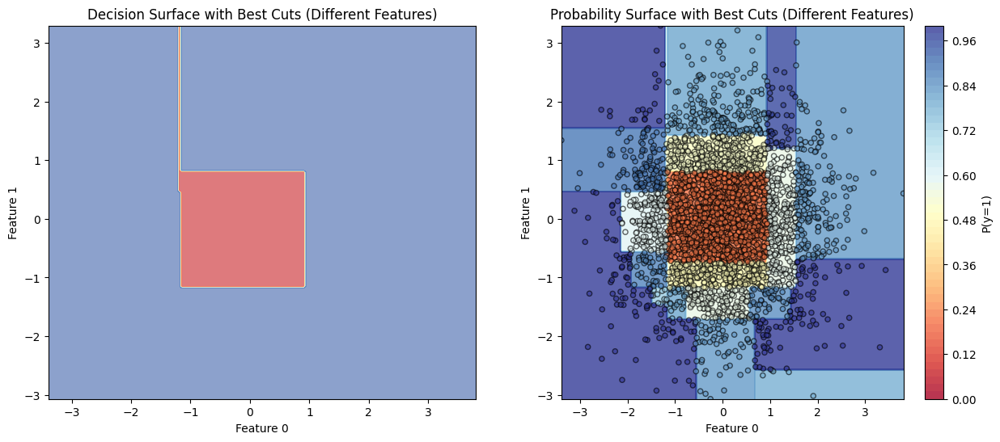

In [44]:
# Subplt for the decision surface and the probability surface
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
# Decision surface
lmt.plot_decision_surface_from_fitted_tree(
    composite_tree.CompositeTreeClassifier(trees, region_conditions, feature_names=["X1", "X2"]),
    X_train[:,:2], (0, 1), ax=ax[0], title="Decision Surface with Best Cuts (Different Features)"
)

lmt.plot_probability_surface_tree(
    composite_tree.CompositeTreeClassifier(trees, region_conditions, feature_names=["X1", "X2"]),
    X_train[:,:2], (0, 1), prob_class=1, ax=ax[1], title="Probability Surface with Best Cuts (Different Features)"
)
plt.show()

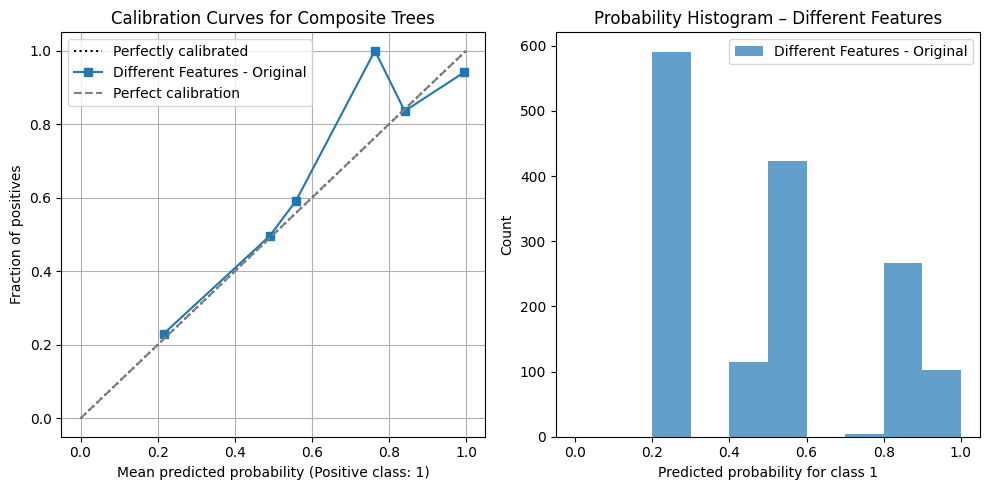

In [45]:
clf_original = composite_tree.CompositeTreeClassifier(trees, region_conditions, feature_names=["X1", "X2"])
n_bins = 10

fig = plt.figure(figsize=(10, 5))
gs = GridSpec(1, 2, figure=fig, height_ratios=[1])  # Corrected to match nrows=1

ax_curve = fig.add_subplot(gs[0])
ax_hist1 = fig.add_subplot(gs[1])

colors = plt.get_cmap("tab10")

# --- Calibration curve ---
proba_o = clf_original.predict_proba(X_test)[:, 1]

CalibrationDisplay.from_predictions(
    y_test, proba_o, n_bins=n_bins,
    name="Different Features - Original",
    ax=ax_curve, color=colors(2 * 0)
    )

ax_curve.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Perfect calibration')
ax_curve.set_title("Calibration Curves for Composite Trees")
ax_curve.set_xlabel("Mean predicted probability (Positive class: 1)")
ax_curve.set_ylabel("Fraction of positives")
ax_curve.grid(True)
ax_curve.legend(loc='best')

# --- Histogram ---
proba_0o = clf_original.predict_proba(X_test)[:, 1]
ax_hist1.hist(proba_0o, bins=n_bins, range=(0, 1), alpha=0.7, color=colors(0), label="Different Features - Original")
ax_hist1.set_title("Probability Histogram – Different Features")
ax_hist1.set_xlabel("Predicted probability for class 1")
ax_hist1.set_ylabel("Count")
ax_hist1.legend()

fig.tight_layout()
plt.show()

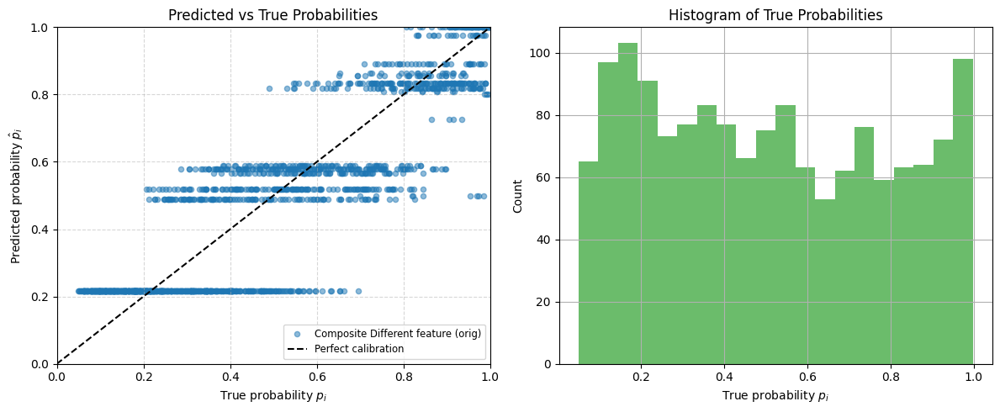

In [55]:
models = {
    "Composite Different feature (orig)": clf_original
}

p_true = expit(alpha * (np.abs(X_test[:, 0])+ np.abs(X_test[:, 1]) - r0))

calibration.plot_pred_vs_true(
    models=models,
    p_true=p_true,
    X_test=X_test,
    model_type='tree',
    orig_cols=2,
    figsize=(12, 5)
)

C:\Users\allis\AppData\Local\Temp\ipykernel_2168\2021436808.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = mpl.cm.get_cmap("Spectral", nq)


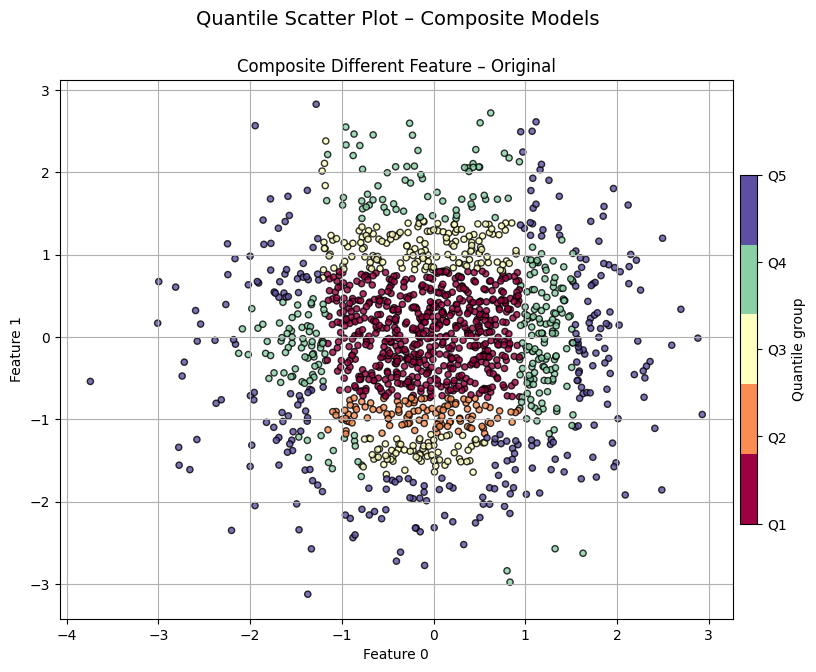

In [47]:
# Obtain predicted probabilities for both sll the four models
y_proba_orig0 = clf_original.predict_proba(X_test[:, :2])[:, 1]

# Definir cuantiles y colores
nq = 5
q_edges = np.quantile(y_proba_orig0, np.linspace(0, 1, nq + 1))
norm = mpl.colors.Normalize(vmin=0, vmax=nq - 1)
cmap = mpl.cm.get_cmap("Spectral", nq)

fig, axes = plt.subplots(1, 1, figsize=(9, 7))
# Plot modelo original
calibration.plot_scatter_by_quantile(
    X_test[:, :2], y_proba_orig0,
    n_quantiles=nq,
    title="Composite Different Feature – Original",
    feature_1=0,
    feature_2=1,
    ax=axes,
    cmap=cmap,
    norm=norm,
    q_edges=q_edges
)

# Colorbar compartido
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])

cbar = fig.colorbar(
    sm,
    ax=axes,  # or replace ax1 with the correct axes variable
    orientation='vertical',
    fraction=0.025,
    pad=0.01
)

cbar.set_label("Quantile group")
cbar.set_ticks(np.arange(nq))
cbar.set_ticklabels([f"Q{i + 1}" for i in range(nq)])

fig.suptitle("Quantile Scatter Plot – Composite Models", fontsize=14)
plt.show()

### LMT V2

In [48]:
# Extended model with 2 cuts in different features
trees, node_models, region_conditions, feats, thresholds = composite_tree.fit_logistic_composite_tree_v2(
    X_train, y_train,
    cut_dict=cut_dict,
    size='regular',
    lb_n_estimators=200,
    lb_cv_splits=5
)

Tree 0 is None? False
Tree 1 is None? False
Tree 2 is None? False
Tree 3 is None? False


c:\Program Files\Python310\lib\site-packages\sklearn\model_selection\_split.py:805: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(


In [49]:
clf_lmt = composite_tree.CompositeTreeClassifier(
    trees=trees,
    region_conditions=region_conditions,
    feature_names=["X1", "X2"]  # adjust if needed
)

# Predict class labels using the composite logistic model tree
y_pred = composite_tree.predict_composite_lmt(X_test, clf_lmt, node_models)

# Accuracy
acc_ext = accuracy_score(y_test, y_pred)
print(f"Accuracy (Extended Model): {acc_ext:.4f}")

Accuracy (Extended Model): 0.6053


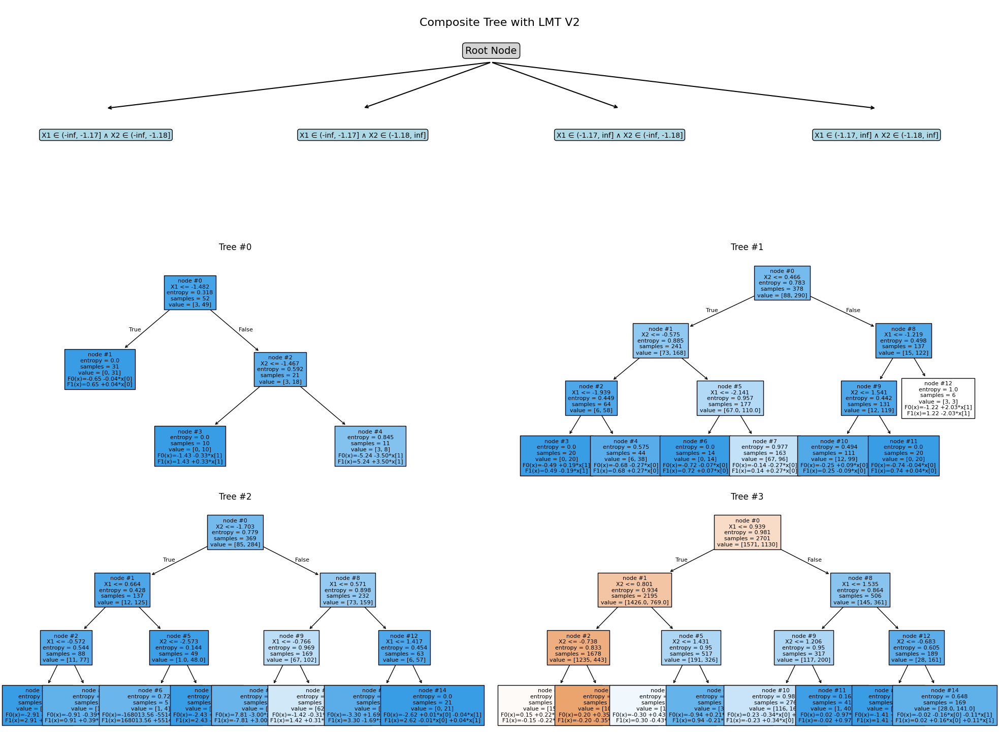

In [50]:
node_models_list = composite_tree.split_node_models_by_tree(node_models, n_trees=len(trees))

composite_tree.plot_tree_with_linear_models_grid_improved(
    trees=trees,
    region_conditions=region_conditions,
    node_models_list=node_models_list,  # result of your split_node_models_by_tree()
    X=X_train,
    feature_names=["X1", "X2"],
    title="Composite Tree with LMT V2",
    show_internal=False
)

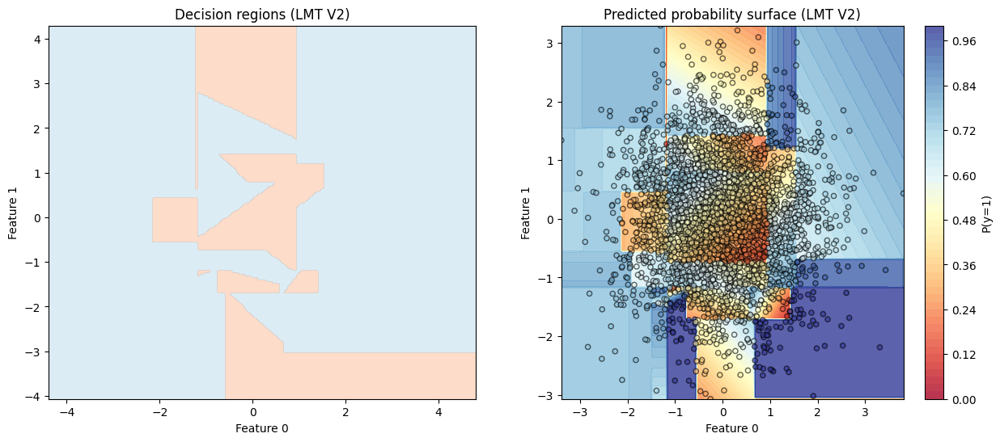

In [51]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
# Plot decision regions for the extended model
lmt.plot_decision_regions_lmt(
    X_train,
    y_train,
    clf_lmt=clf_lmt,
    nodes_lmt=node_models,
    feature_pair=(0, 1),
    fill_value="mean",
    grid_steps=200,
    cmap='RdYlBu',
    ax=ax[0],
    title="Decision regions (LMT V2)",
    show_scatter=False,
    tree_model='composite'
)
lmt.plot_probability_surface_lmt(
    clf_lmt=clf_lmt,
    nodes_lmt=node_models,
    X=X_train,
    feature_pair=(0,1),
    prob_class=1,
    fixed_vals=None,
    grid_steps=200,
    cmap='RdYlBu',
    ax=ax[1],
    title='Predicted probability surface (LMT V2)',
    show_scatter=True,
    tree_model='composite'
)
plt.show()

C:\Users\allis\AppData\Local\Temp\ipykernel_2168\4040988463.py:38: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("tab10")


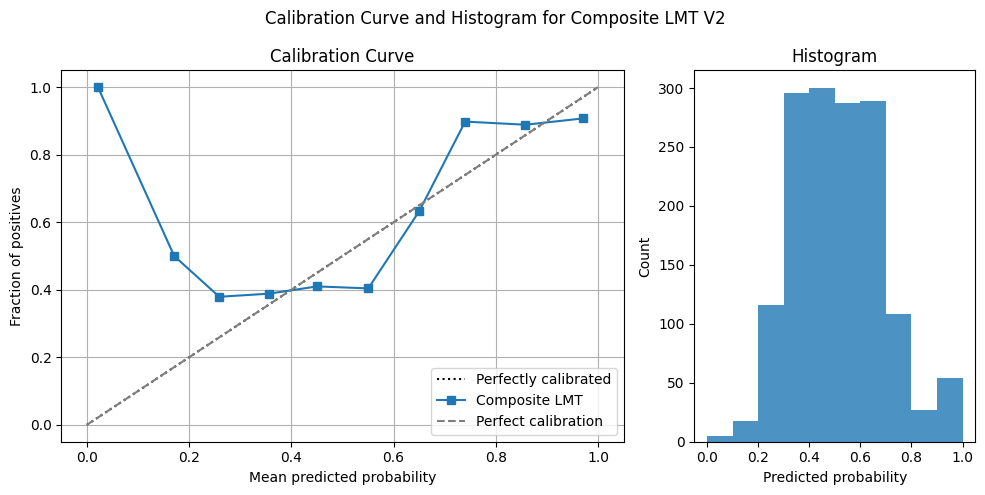

In [52]:
plot_calibration_curve_composite_lmt(
    X_test=X_test,
    y_test=y_test,
    composite_clf=clf_lmt,
    node_models=node_models,
    n_bins=10,
    title="Calibration Curve and Histogram for Composite LMT V2"
)

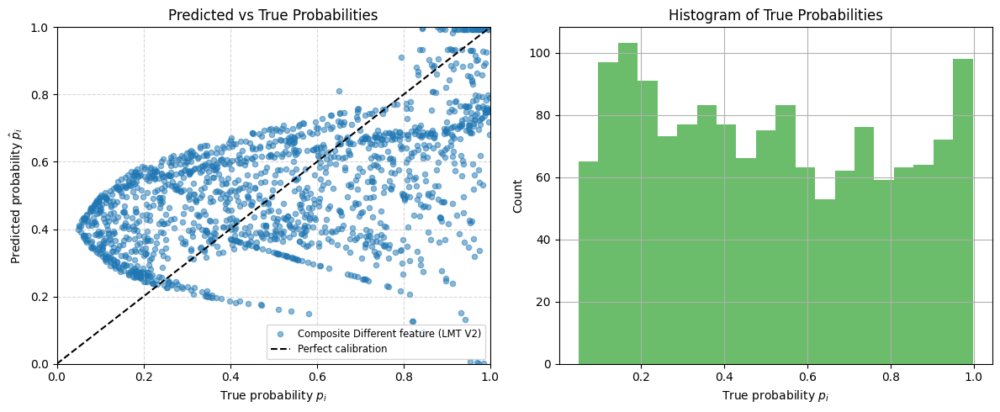

In [56]:
calibration.plot_pred_vs_true(
    models={"Composite Different feature (LMT V2)": (clf_lmt, node_models)},
    p_true=p_true,
    X_test=X_test,
    model_type='composite',
    orig_cols=2,
    figsize=(12, 5)
)
plt.show()

C:\Users\allis\AppData\Local\Temp\ipykernel_2168\1633140607.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = mpl.cm.get_cmap("Spectral", nq)


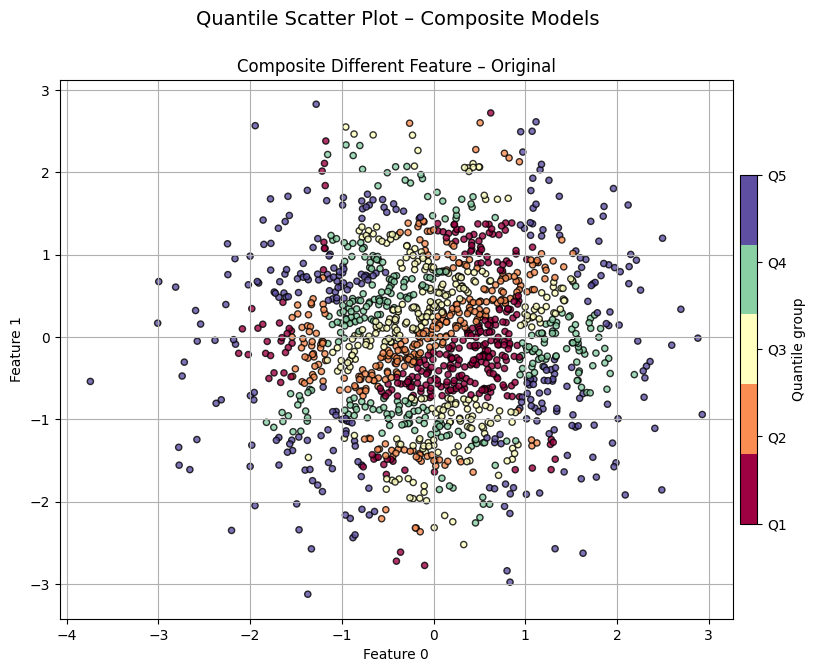

In [54]:
# Obtain predicted probabilities for both sll the four models
y_proba_orig0 = composite_tree.predict_proba_composite_lmt(X_test, clf_lmt, node_models)[:, 1]

# Definir cuantiles y colores
nq = 5
q_edges = np.quantile(y_proba_orig0, np.linspace(0, 1, nq + 1))
norm = mpl.colors.Normalize(vmin=0, vmax=nq - 1)
cmap = mpl.cm.get_cmap("Spectral", nq)

fig, axes = plt.subplots(1, 1, figsize=(9, 7))
# Plot modelo original
calibration.plot_scatter_by_quantile(
    X_test[:, :2], y_proba_orig0,
    n_quantiles=nq,
    title="Composite Different Feature – Original",
    feature_1=0,
    feature_2=1,
    ax=axes,
    cmap=cmap,
    norm=norm,
    q_edges=q_edges
)

# Colorbar compartido
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])

cbar = fig.colorbar(
    sm,
    ax=axes,  # or replace ax1 with the correct axes variable
    orientation='vertical',
    fraction=0.025,
    pad=0.01
)

cbar.set_label("Quantile group")
cbar.set_ticks(np.arange(nq))
cbar.set_ticklabels([f"Q{i + 1}" for i in range(nq)])

fig.suptitle("Quantile Scatter Plot – Composite Models", fontsize=14)
plt.show()